In [18]:
import uproot
import glob
import pandas as pd
import warnings
warnings.simplefilter(action="ignore", category=pd.errors.PerformanceWarning)
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec
import yahist
import itertools
import mplhep as hep
import xgboost as xgb #BDT
import pickle

plt.rcParams.update({"figure.facecolor":  (1,1,1,0)})

from utils.analysis import Optimization

TAG = "nopnetfix"

In [19]:
babies = sorted(glob.glob(f"../analysis/studies/vbsvvhjets/output_{TAG}/Run2/*.root"))
sig_babies = [baby for baby in babies if "VBSVVH" in baby]
bkg_babies = [baby for baby in babies if "VBS" not in baby and "data" not in baby]
data_babies = [baby for baby in babies if "data" in baby]
print("Signal:")
print("\n".join(sig_babies))
print("Background:")
print("\n".join(bkg_babies))
print("Data:")
print("\n".join(data_babies))

Signal:
../analysis/studies/vbsvvhjets/output_nopnetfix/Run2/VBSVVH.root
Background:
../analysis/studies/vbsvvhjets/output_nopnetfix/Run2/Bosons.root
../analysis/studies/vbsvvhjets/output_nopnetfix/Run2/QCD.root
../analysis/studies/vbsvvhjets/output_nopnetfix/Run2/SingleTop.root
../analysis/studies/vbsvvhjets/output_nopnetfix/Run2/TT1L.root
../analysis/studies/vbsvvhjets/output_nopnetfix/Run2/TTH.root
../analysis/studies/vbsvvhjets/output_nopnetfix/Run2/TTHad.root
../analysis/studies/vbsvvhjets/output_nopnetfix/Run2/TTW.root
Data:
../analysis/studies/vbsvvhjets/output_nopnetfix/Run2/data.root


In [20]:
vbsvvh = Optimization(
    sig_root_files=sig_babies,
    bkg_root_files=bkg_babies,
    data_root_files=data_babies,
    ttree_name="tree",
    weight_columns=[
        "xsec_sf", 
        "pu_sf", 
        "prefire_sf", 
    ],
    plots_dir=f"/home/users/jguiang/public_html/vbsvvhjets_plots/{TAG}/opt",
    sample_labels = {
        "VBSVVH": r"VBS VVH $(C_{2V} = 2)$", 
        "TTHad": r"$t\bar{t}+$jets",
        "TT1L": r"$t\bar{t}+1\ell$",
        "QCD": "QCD",
        "SingleTop": r"Single $t$",
        "TTH": r"$t\bar{t}+H$",
        "TTW": r"$t\bar{t}+W$",
    },
#     reweight_column="reweights"
)

vbsvvh.df["objsel"] = True
vbsvvh.df["presel"] = vbsvvh.df.eval(
    "objsel and hbbfatjet_xbb > 0.5 and ld_vqqfatjet_xwqq > 0.3 and tr_vqqfatjet_xwqq > 0.3"
)
# vbsvvh.make_selection("presel")
# # vbsvvh.df["qcdnorm_CR"] = vbsvvh.df.eval(
# #     "obj_sel and hbbfatjet_xbb > 0.1 and ld_vqqfatjet_xwqq > 0.5 and tr_vqqfatjet_xwqq > 0.5"
# # )
# # vbsvvh.make_selection("qcdnorm_CR")

# bdt_name = "bdt_mediumPresel"
# with open(f"../analysis/studies/vbsvvhjets/vbsvvhjets_bdt/{bdt_name}_features.txt", "r") as txt_file:
#     features = txt_file.read().splitlines()
# bst = pickle.load(open(f"../analysis/studies/vbsvvhjets/vbsvvhjets_bdt/{bdt_name}.pkl", "rb"))
# vbsvvh.df["bdt"] = bst.predict(xgb.DMatrix(vbsvvh.df[features]))

vbsvvh.df["hbbfatjet_abs_eta"] = np.abs(vbsvvh.df.hbbfatjet_eta.abs())
vbsvvh.df["hbbfatjet_abs_phi"] = np.abs(vbsvvh.df.hbbfatjet_phi.abs())
vbsvvh.df["ld_vqqfatjet_abs_eta"] = np.abs(vbsvvh.df.ld_vqqfatjet_eta.abs())
vbsvvh.df["ld_vqqfatjet_abs_phi"] = np.abs(vbsvvh.df.ld_vqqfatjet_phi.abs())
vbsvvh.df["tr_vqqfatjet_abs_eta"] = np.abs(vbsvvh.df.tr_vqqfatjet_eta.abs())
vbsvvh.df["tr_vqqfatjet_abs_phi"] = np.abs(vbsvvh.df.tr_vqqfatjet_phi.abs())

Loading data babies: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


In [21]:
def get_cutflow_row(selections):
    for selection_i, selection in enumerate(selections):
        samples = {
            "QCD": 0, "TTHad": 0, "TT1L": 0, "TTW": 0, "TTH": 0, "SingleTop": 0, "Bosons": 0, "TotalBkg": 0,
            "TotalSig": 0
        }
        for sample in samples.keys():
            if sample != "TotalBkg":
                count = vbsvvh.sample_count(sample, selection=selection)
                samples[sample] = count
                samples["TotalBkg"] += count

        samples["TotalSig"] = vbsvvh.sig_count(selection=selection)
        
        if selection_i == 0:
            print(",".join(samples.keys()))
            
        print(",".join([f"{value}" for value in samples.values()]))

In [22]:
get_cutflow_row(["objsel"])

QCD,TTHad,TT1L,TTW,TTH,SingleTop,Bosons,TotalBkg,TotalSig
155677.0603152804,6222.281153158399,862.0189078986291,59.329374154376744,30.432555677642195,482.0182093289736,5185.388339377671,168518.5288548761,17.945595006186803


Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/ld_vqqfatjet_xwqq_correlations_objsel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/correlation2D_ld_vqqfatjet_xwqq_ld_vqqfatjet_pt_1Dprofile_QCD_flipped.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/tr_vqqfatjet_xwqq_correlations_objsel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/correlation2D_tr_vqqfatjet_xwqq_tr_vqqfatjet_pt_1Dprofile_QCD_flipped.pdf


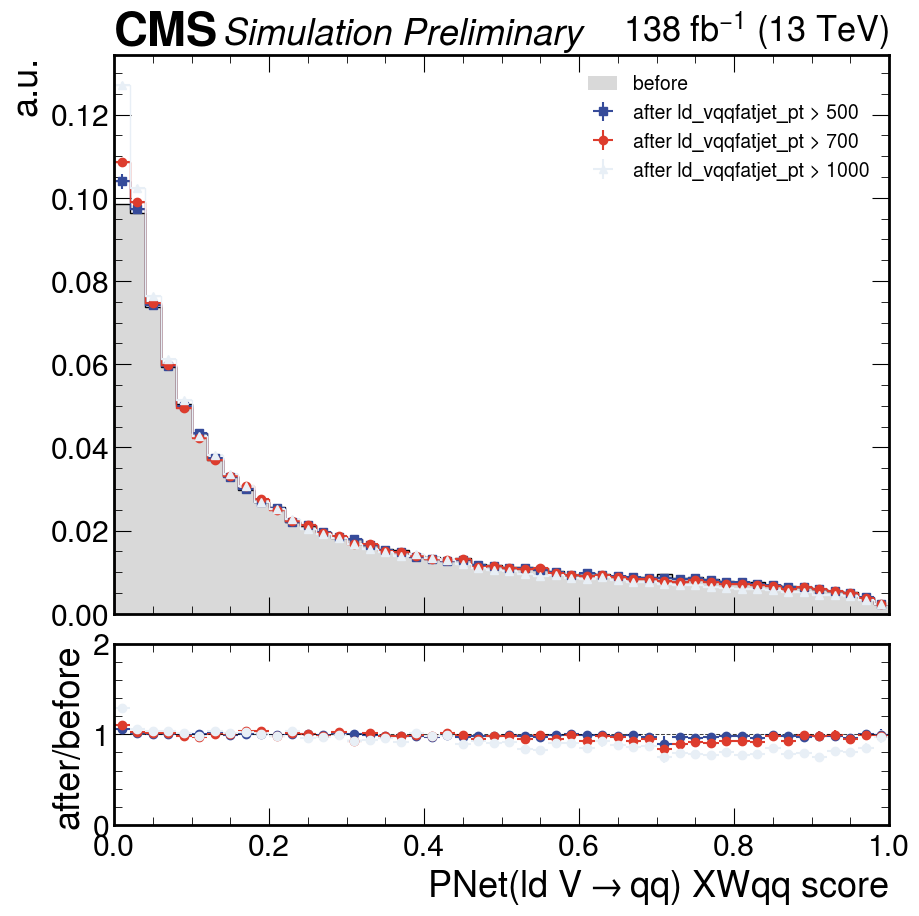

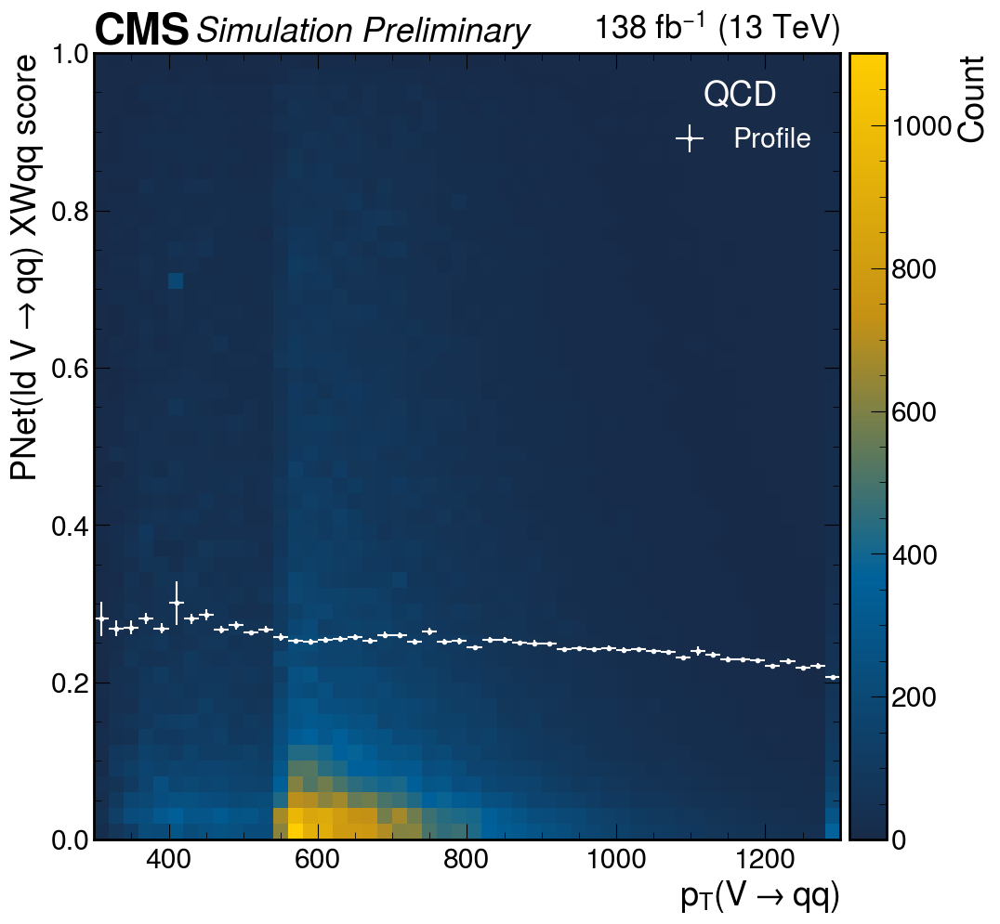

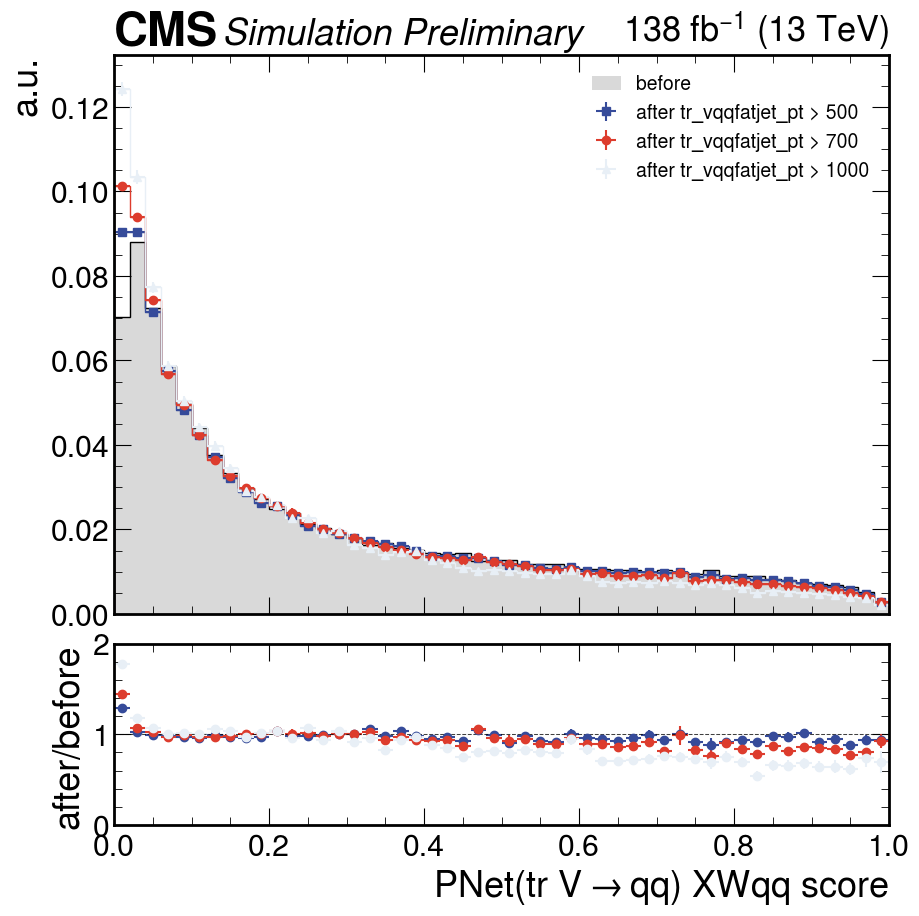

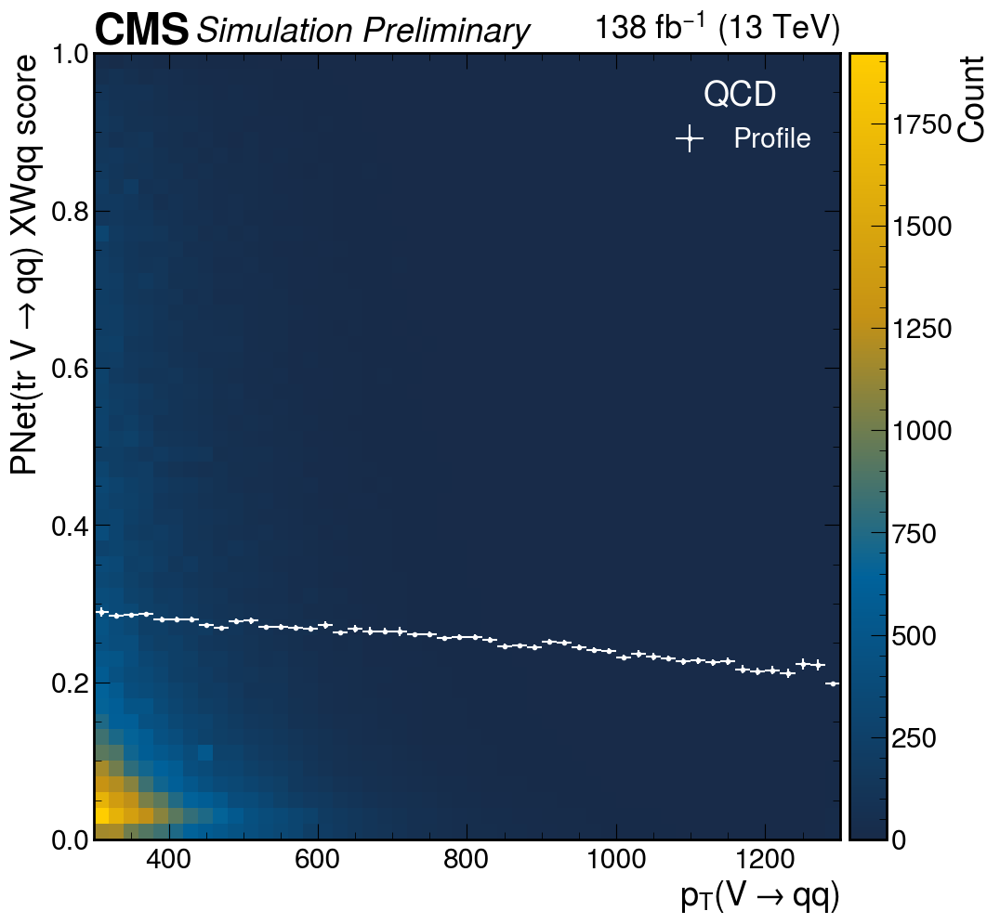

In [23]:
vbsvvh.plot_correlation(
    "ld_vqqfatjet_xwqq", np.linspace(0, 1, 51),
    selections=[
        "ld_vqqfatjet_pt > 500",
        "ld_vqqfatjet_pt > 700",
        "ld_vqqfatjet_pt > 1000"
    ],
    base_selection="objsel",
    x_label=r"PNet$($ld $V\rightarrow qq)$ XWqq score"
)
vbsvvh.plot_correlation2D(
    "ld_vqqfatjet_xwqq", "ld_vqqfatjet_pt", 
    np.linspace(0, 1.0, 51), np.linspace(300, 1300, 51),
    flip=True, sample="QCD",
    x_label=r"PNet$($ld $V\rightarrow qq)$ XWqq score",
    y_label=r"$p_T(V\rightarrow qq)$"
)

vbsvvh.plot_correlation(
    "tr_vqqfatjet_xwqq", np.linspace(0, 1, 51),
    selections=[
        "tr_vqqfatjet_pt > 500",
        "tr_vqqfatjet_pt > 700",
        "tr_vqqfatjet_pt > 1000"
    ],
    base_selection="objsel",
    x_label=r"PNet$($tr $V\rightarrow qq)$ XWqq score"
)
vbsvvh.plot_correlation2D(
    "tr_vqqfatjet_xwqq", "tr_vqqfatjet_pt", 
    np.linspace(0, 1.0, 51), np.linspace(300, 1300, 51),
    flip=True, sample="QCD",
    x_label=r"PNet$($tr $V\rightarrow qq)$ XWqq score",
    y_label=r"$p_T(V\rightarrow qq)$"
)

Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/ld_vqqfatjet_xwqq_correlations_objsel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/correlation2D_ld_vqqfatjet_xwqq_ld_vqqfatjet_abs_eta_1Dprofile_QCD_flipped.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/tr_vqqfatjet_xwqq_correlations_objsel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/correlation2D_tr_vqqfatjet_xwqq_tr_vqqfatjet_abs_eta_1Dprofile_QCD_flipped.pdf


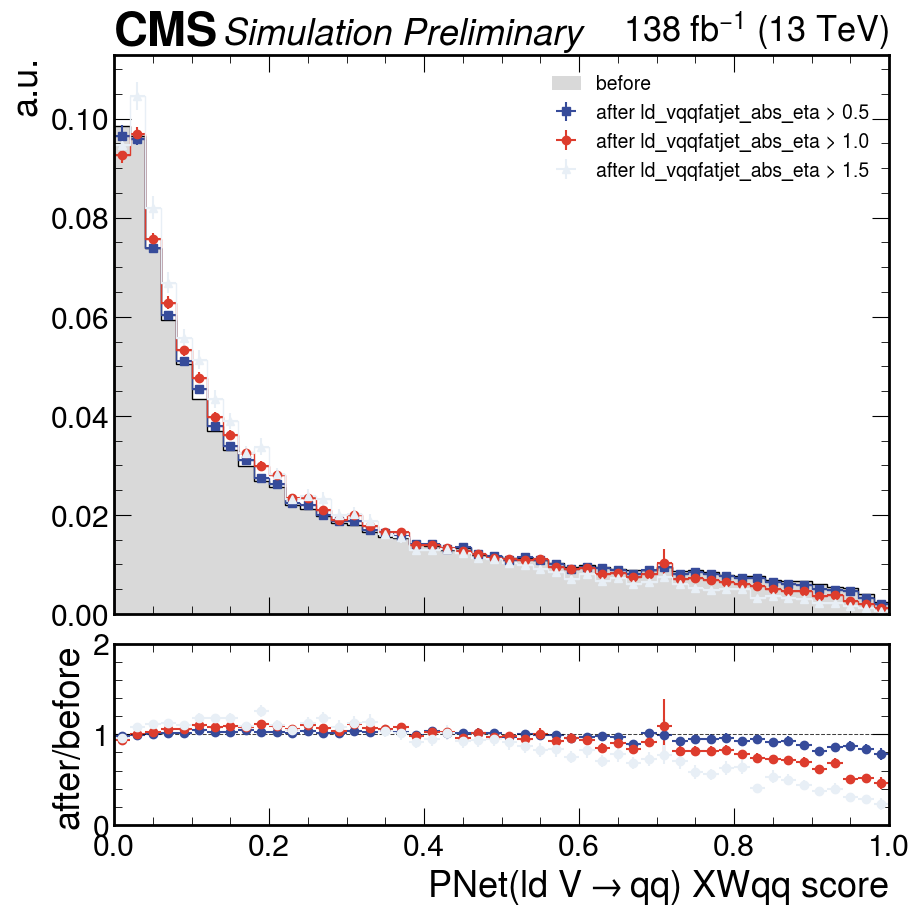

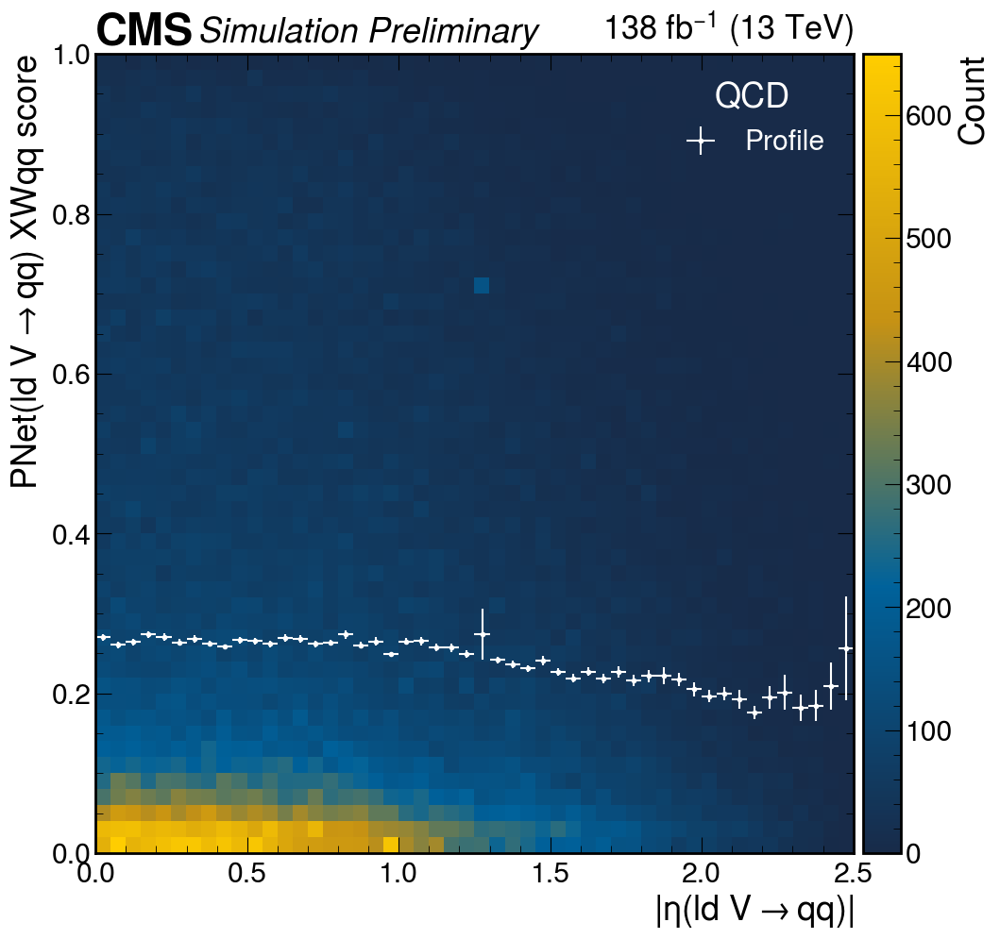

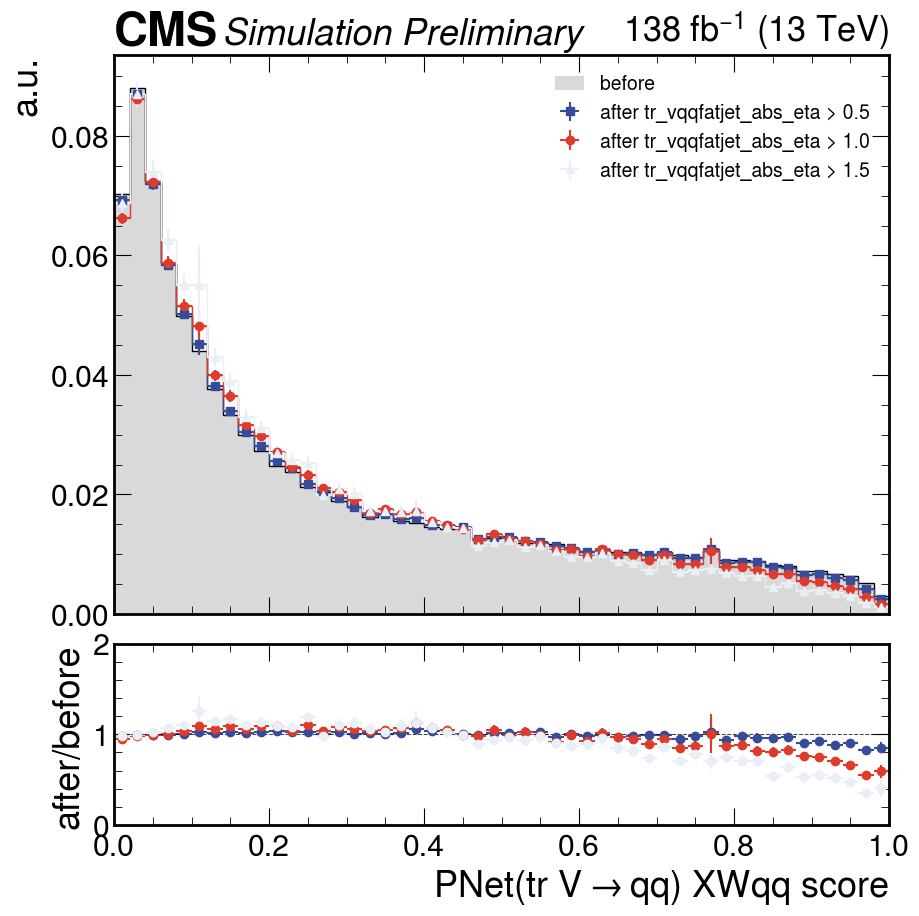

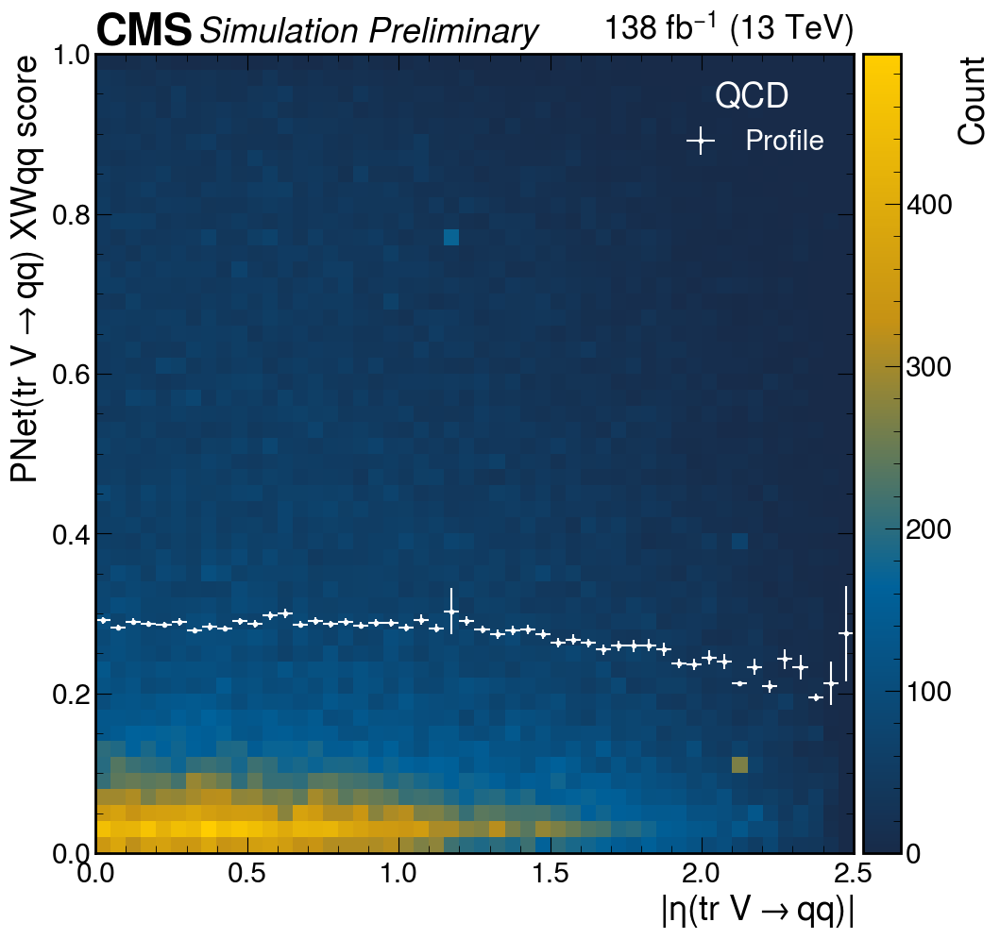

In [24]:
vbsvvh.plot_correlation(
    "ld_vqqfatjet_xwqq", np.linspace(0, 1, 51),
    selections=[
        "ld_vqqfatjet_abs_eta > 0.5",
        "ld_vqqfatjet_abs_eta > 1.0",
        "ld_vqqfatjet_abs_eta > 1.5"
    ],
    base_selection="objsel",
    x_label=r"PNet$($ld $V\rightarrow qq)$ XWqq score"
)
vbsvvh.plot_correlation2D(
    "ld_vqqfatjet_xwqq", "ld_vqqfatjet_abs_eta", 
    np.linspace(0, 1.0, 51), np.linspace(0, 2.5, 51),
    flip=True, sample="QCD",
    x_label=r"PNet$($ld $V\rightarrow qq)$ XWqq score",
    y_label=r"$|\eta($ld $V\rightarrow qq)|$",
)

vbsvvh.plot_correlation(
    "tr_vqqfatjet_xwqq", np.linspace(0, 1, 51),
    selections=[
        "tr_vqqfatjet_abs_eta > 0.5",
        "tr_vqqfatjet_abs_eta > 1.0",
        "tr_vqqfatjet_abs_eta > 1.5"
    ],
    base_selection="objsel",
    x_label=r"PNet$($tr $V\rightarrow qq)$ XWqq score"
)
vbsvvh.plot_correlation2D(
    "tr_vqqfatjet_xwqq", "tr_vqqfatjet_abs_eta", 
    np.linspace(0, 1.0, 51), np.linspace(0, 2.5, 51),
    flip=True, sample="QCD",
    x_label=r"PNet$($tr $V\rightarrow qq)$ XWqq score",
    y_label=r"$|\eta($tr $V\rightarrow qq)|$",
)

Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/ld_vqqfatjet_xwqq_correlations_objsel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/correlation2D_ld_vqqfatjet_xwqq_ld_vqqfatjet_abs_phi_1Dprofile_QCD_flipped.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/tr_vqqfatjet_xwqq_correlations_objsel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/correlation2D_tr_vqqfatjet_xwqq_tr_vqqfatjet_abs_phi_1Dprofile_QCD_flipped.pdf


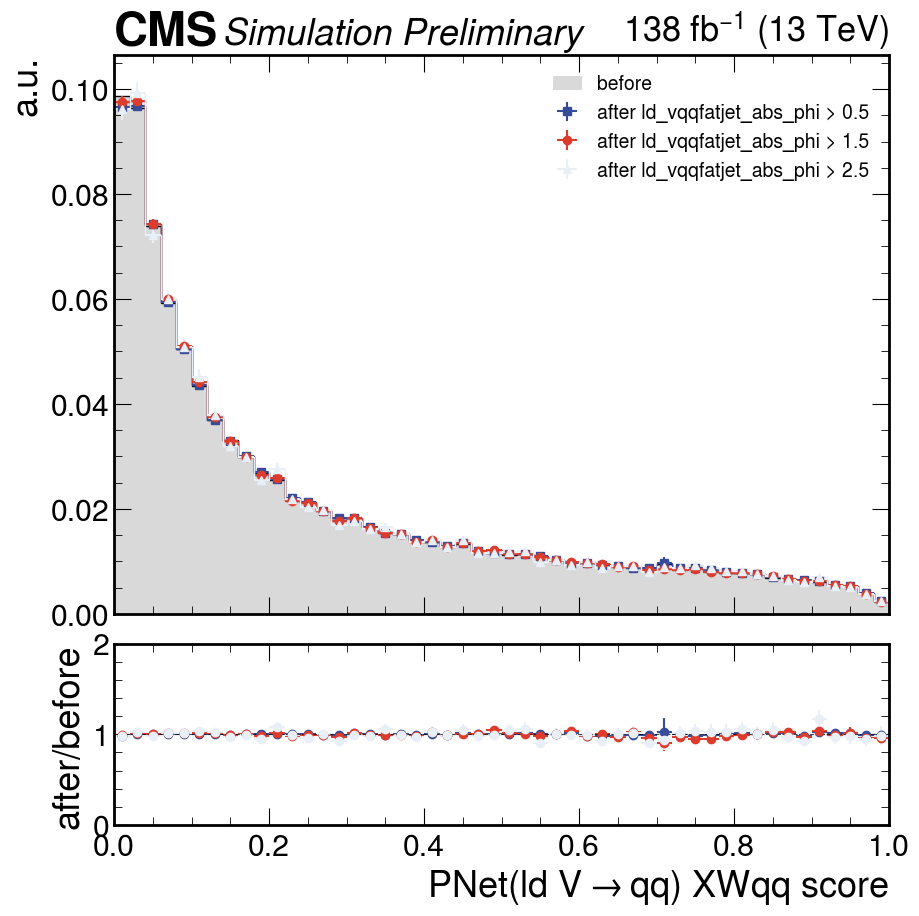

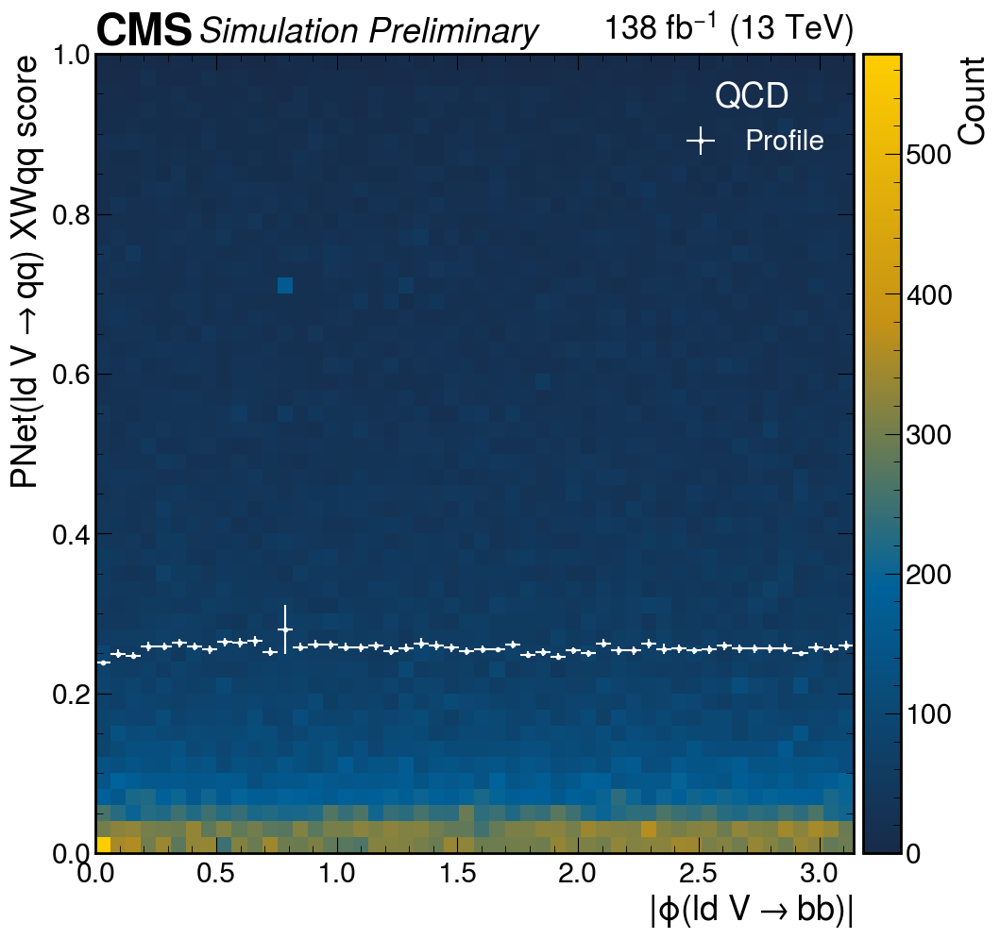

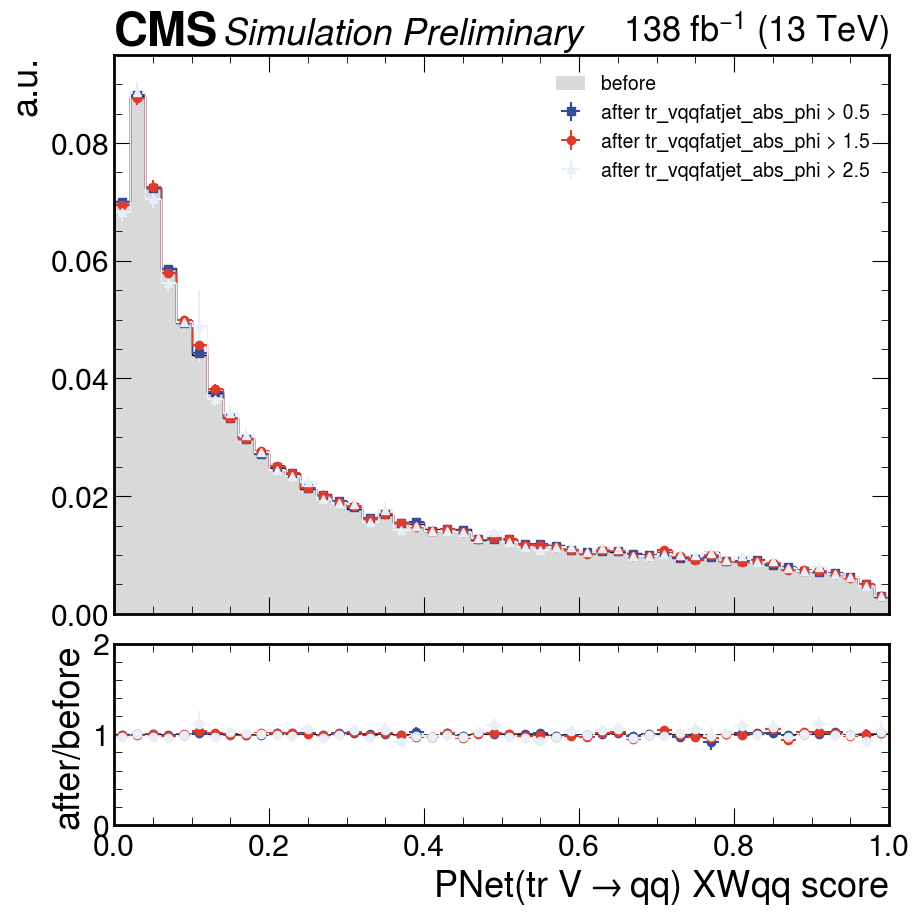

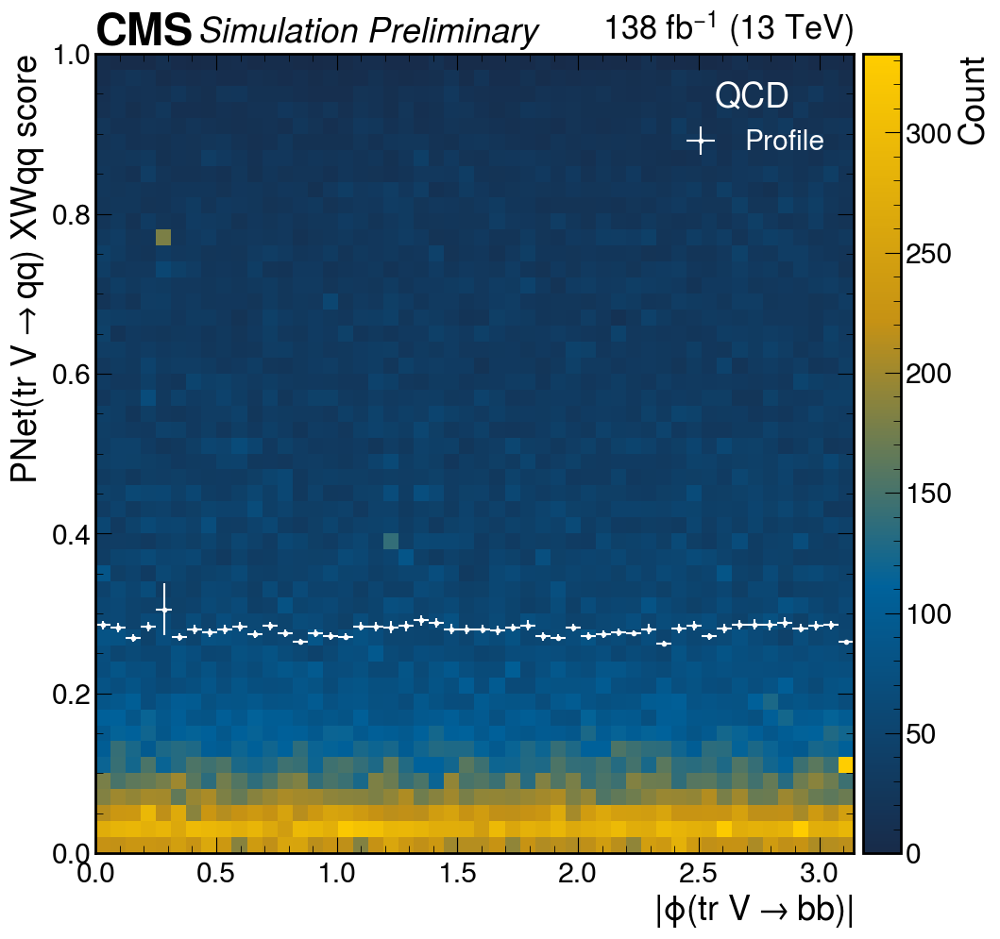

In [25]:
vbsvvh.plot_correlation(
    "ld_vqqfatjet_xwqq", np.linspace(0, 1, 51),
    selections=[
        "ld_vqqfatjet_abs_phi > 0.5",
        "ld_vqqfatjet_abs_phi > 1.5",
        "ld_vqqfatjet_abs_phi > 2.5"
    ],
    base_selection="objsel",
    x_label=r"PNet$($ld $V\rightarrow qq)$ XWqq score"
)
vbsvvh.plot_correlation2D(
    "ld_vqqfatjet_xwqq", "ld_vqqfatjet_abs_phi", 
    np.linspace(0, 1.0, 51), np.linspace(0, np.pi, 51),
    flip=True, sample="QCD",
    x_label=r"PNet$($ld $V\rightarrow qq)$ XWqq score",
    y_label=r"$|\phi($ld $V\rightarrow bb)|$",
)

vbsvvh.plot_correlation(
    "tr_vqqfatjet_xwqq", np.linspace(0, 1, 51),
    selections=[
        "tr_vqqfatjet_abs_phi > 0.5",
        "tr_vqqfatjet_abs_phi > 1.5",
        "tr_vqqfatjet_abs_phi > 2.5"
    ],
    base_selection="objsel",
    x_label=r"PNet$($tr $V\rightarrow qq)$ XWqq score"
)
vbsvvh.plot_correlation2D(
    "tr_vqqfatjet_xwqq", "tr_vqqfatjet_abs_phi", 
    np.linspace(0, 1.0, 51), np.linspace(0, np.pi, 51),
    flip=True, sample="QCD",
    x_label=r"PNet$($tr $V\rightarrow qq)$ XWqq score",
    y_label=r"$|\phi($tr $V\rightarrow bb)|$",
)

Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/ld_vqqfatjet_xwqq_correlations_objsel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/correlation2D_ld_vqqfatjet_xwqq_ld_vqqfatjet_mass_1Dprofile_QCD_flipped.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/tr_vqqfatjet_xwqq_correlations_objsel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/correlation2D_tr_vqqfatjet_xwqq_tr_vqqfatjet_mass_1Dprofile_QCD_flipped.pdf


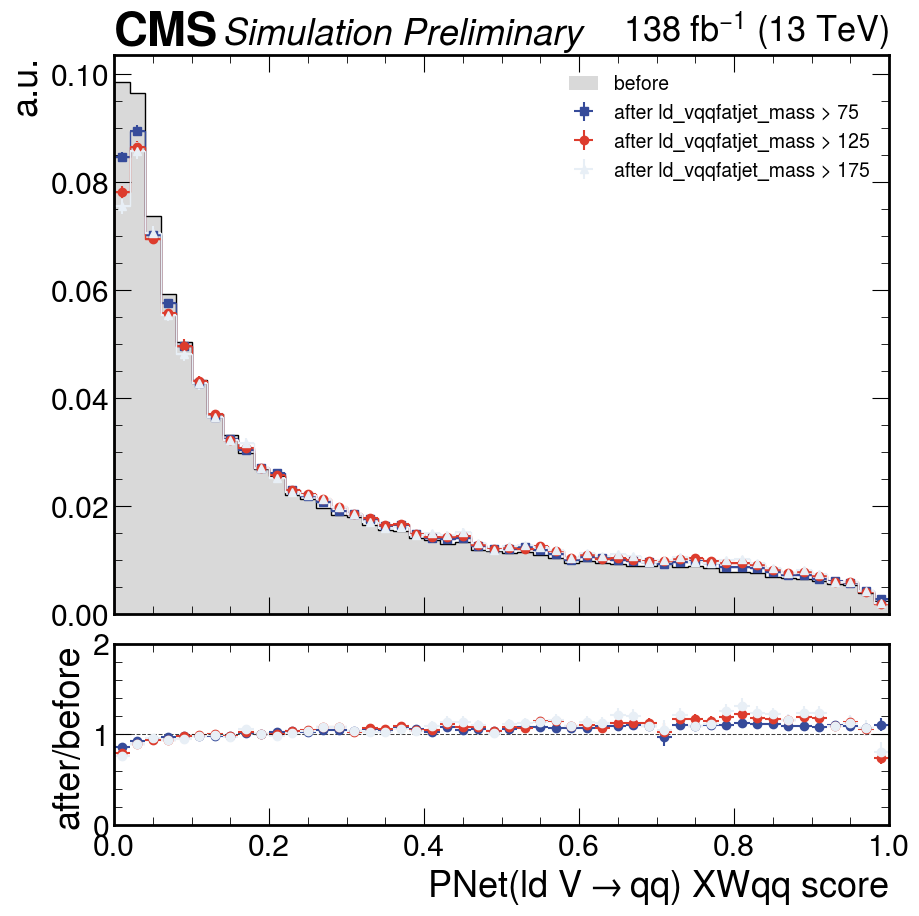

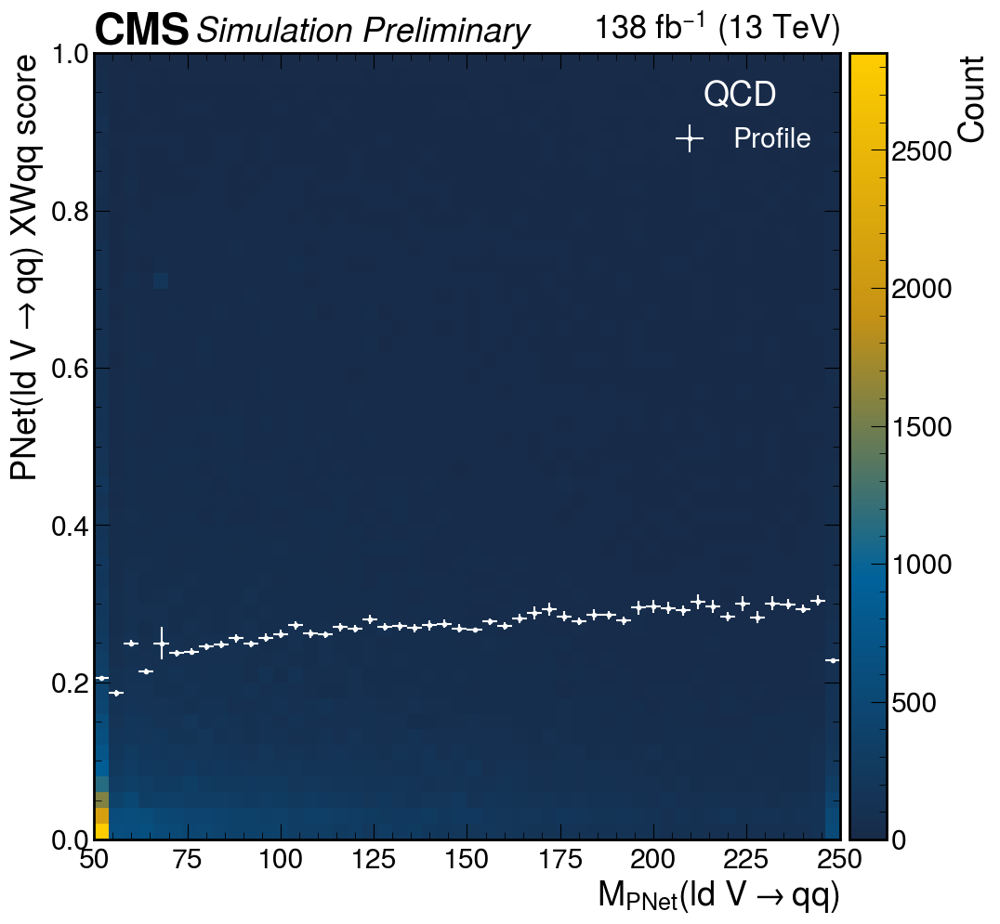

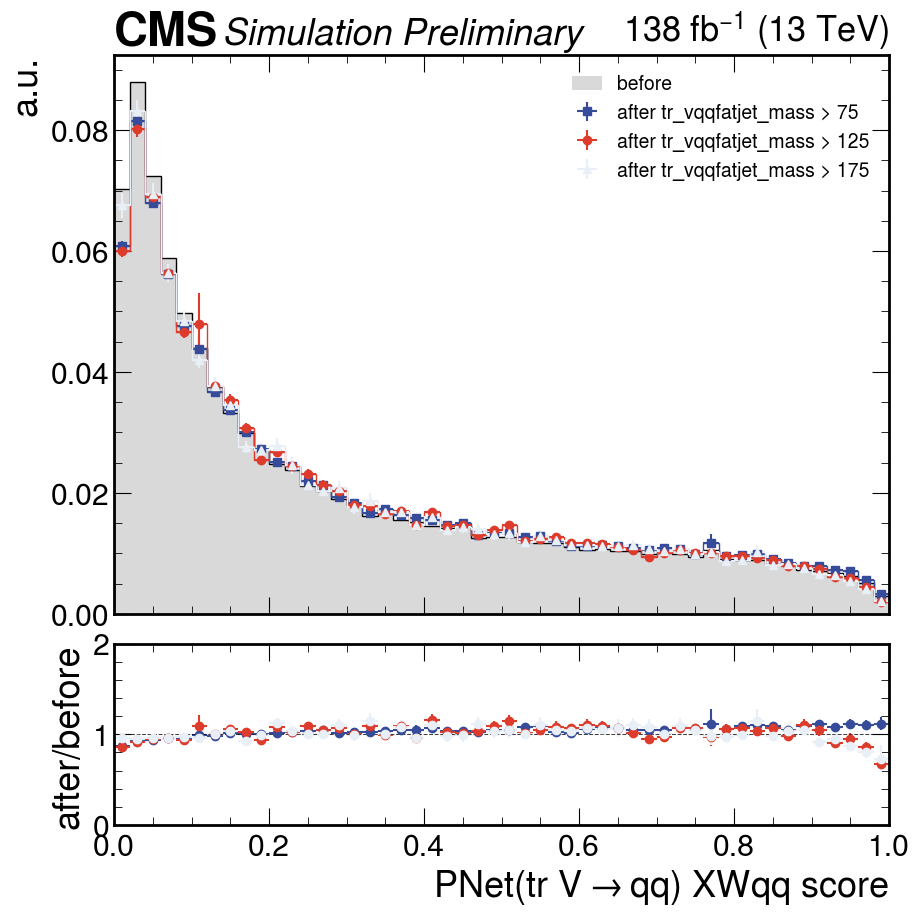

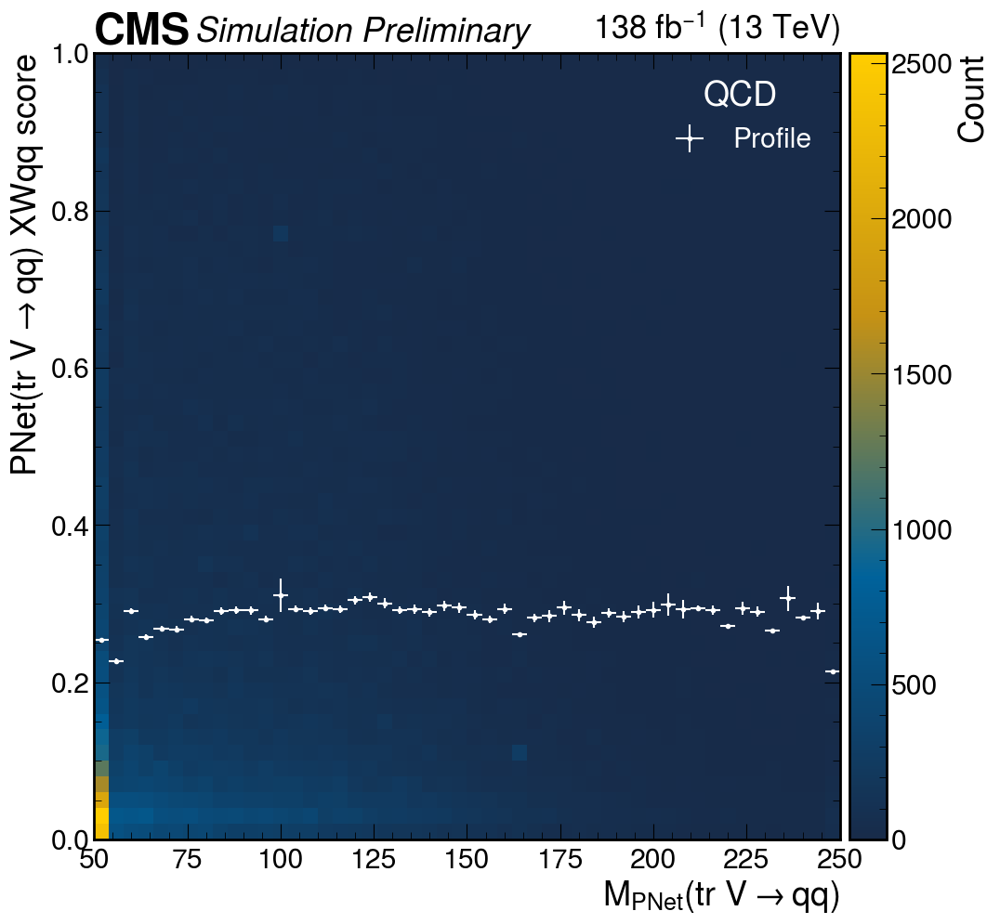

In [26]:
vbsvvh.plot_correlation(
    "ld_vqqfatjet_xwqq", np.linspace(0, 1, 51),
    selections=[
        "ld_vqqfatjet_mass > 75",
        "ld_vqqfatjet_mass > 125",
        "ld_vqqfatjet_mass > 175",
    ],
    base_selection="objsel",
    x_label=r"PNet$($ld $V\rightarrow qq)$ XWqq score"
)
vbsvvh.plot_correlation2D(
    "ld_vqqfatjet_xwqq", "ld_vqqfatjet_mass", 
    np.linspace(0, 1.0, 51), np.linspace(50, 250, 51),
    flip=True, sample="QCD",
    x_label=r"PNet$($ld $V\rightarrow qq)$ XWqq score",
    y_label=r"$M_{PNet}($ld $V\rightarrow qq)$",
)

vbsvvh.plot_correlation(
    "tr_vqqfatjet_xwqq", np.linspace(0, 1, 51),
    selections=[
        "tr_vqqfatjet_mass > 75",
        "tr_vqqfatjet_mass > 125",
        "tr_vqqfatjet_mass > 175",
    ],
    base_selection="objsel",
    x_label=r"PNet$($tr $V\rightarrow qq)$ XWqq score"
)
vbsvvh.plot_correlation2D(
    "tr_vqqfatjet_xwqq", "tr_vqqfatjet_mass", 
    np.linspace(0, 1.0, 51), np.linspace(50, 250, 51),
    flip=True, sample="QCD",
    x_label=r"PNet$($tr $V\rightarrow qq)$ XWqq score",
    y_label=r"$M_{PNet}($tr $V\rightarrow qq)$",
)

Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/hbbfatjet_xbb_correlations_objsel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/correlation2D_hbbfatjet_xbb_hbbfatjet_pt_1Dprofile_QCD_flipped.pdf


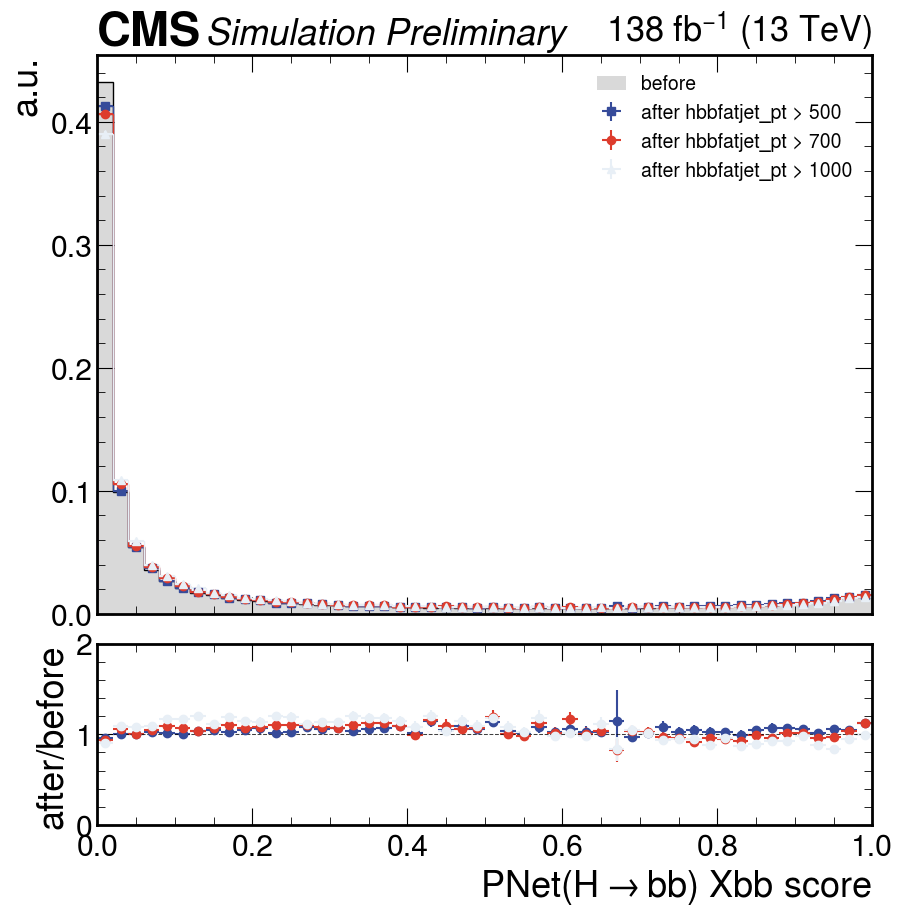

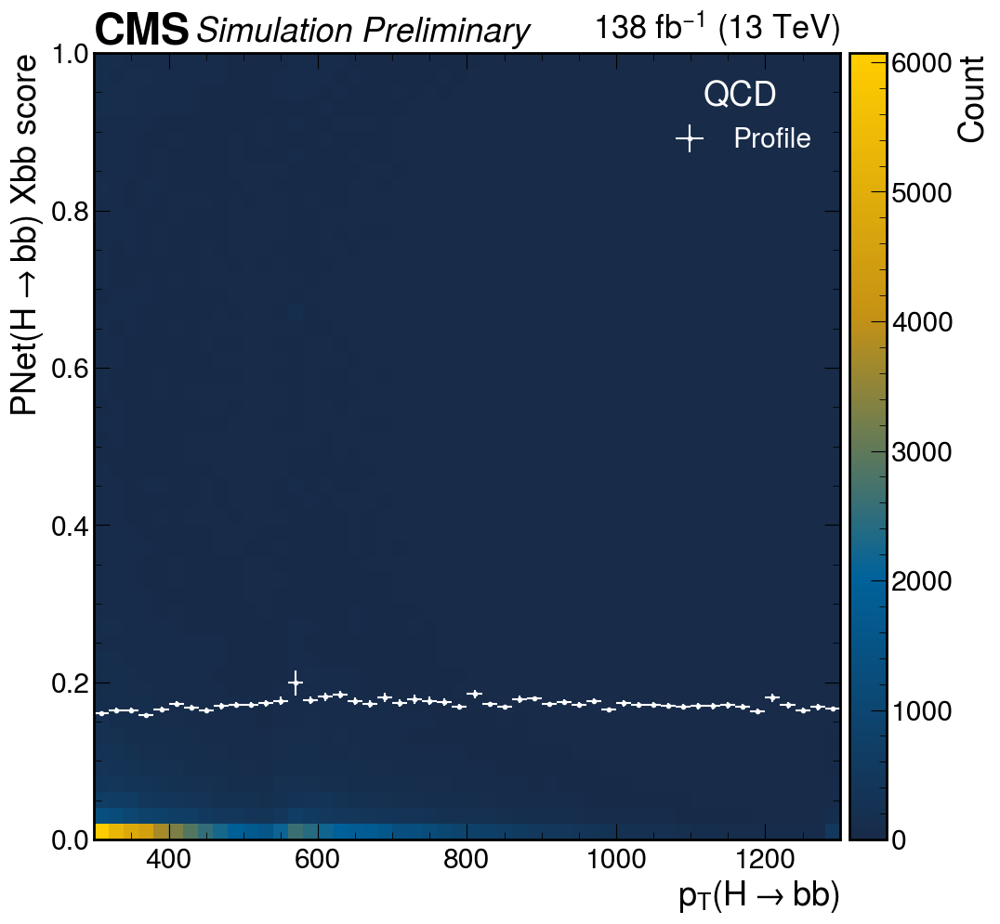

In [27]:
vbsvvh.plot_correlation(
    "hbbfatjet_xbb", np.linspace(0, 1, 51),
    selections=[
        "hbbfatjet_pt > 500",
        "hbbfatjet_pt > 700",
        "hbbfatjet_pt > 1000"
    ],
    base_selection="objsel",
    x_label=r"PNet$(H\rightarrow bb)$ Xbb score"
)
vbsvvh.plot_correlation2D(
    "hbbfatjet_xbb", "hbbfatjet_pt", 
    np.linspace(0, 1.0, 51), np.linspace(300, 1300, 51),
    flip=True, sample="QCD",
    x_label=r"PNet$(H\rightarrow bb)$ Xbb score",
    y_label=r"$p_T(H\rightarrow bb)$"
)

Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/hbbfatjet_xbb_correlations_objsel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/correlation2D_hbbfatjet_xbb_hbbfatjet_abs_eta_1Dprofile_QCD_flipped.pdf


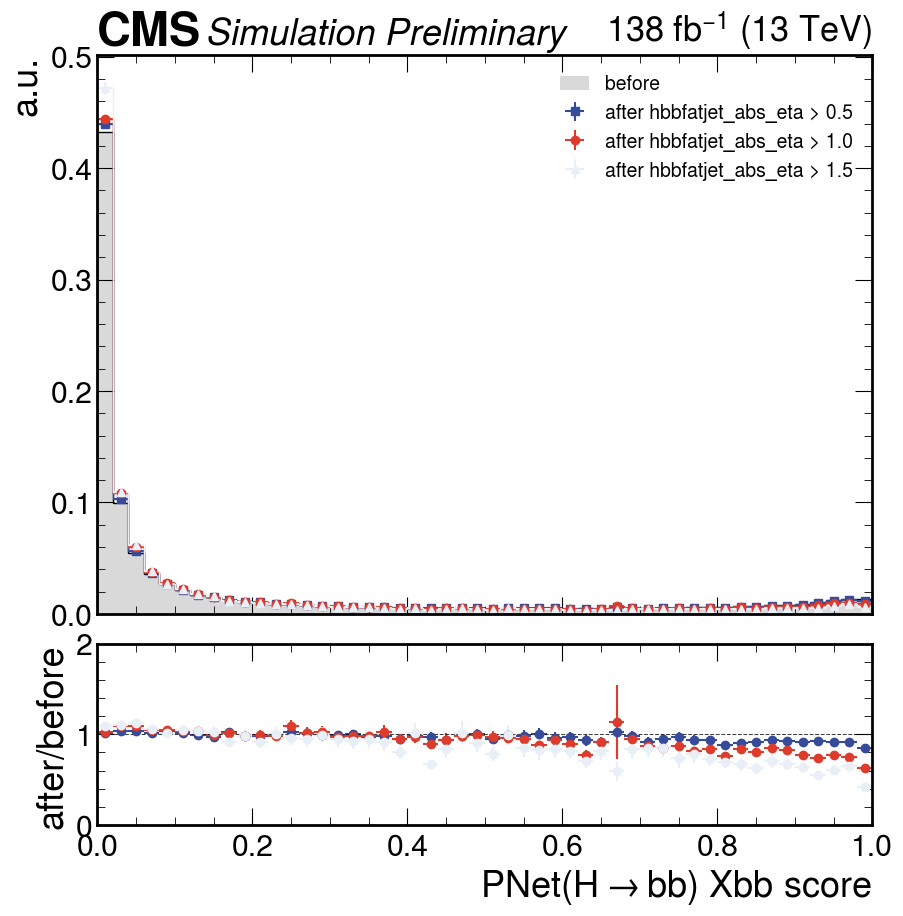

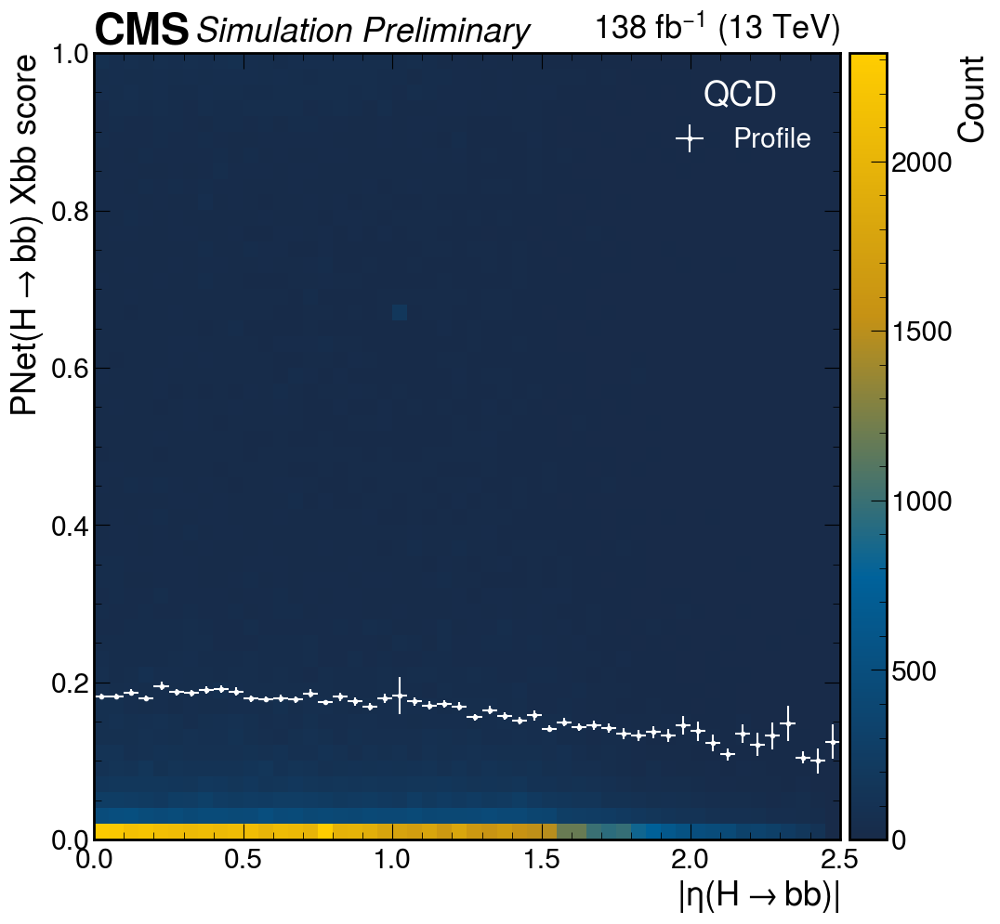

In [28]:
vbsvvh.plot_correlation(
    "hbbfatjet_xbb", np.linspace(0, 1, 51),
    selections=[
        "hbbfatjet_abs_eta > 0.5",
        "hbbfatjet_abs_eta > 1.0",
        "hbbfatjet_abs_eta > 1.5"
    ],
    base_selection="objsel",
    x_label=r"PNet$(H\rightarrow bb)$ Xbb score"
)
vbsvvh.plot_correlation2D(
    "hbbfatjet_xbb", "hbbfatjet_abs_eta", 
    np.linspace(0, 1.0, 51), np.linspace(0, 2.5, 51),
    flip=True, sample="QCD",
    x_label=r"PNet$(H\rightarrow bb)$ Xbb score",
    y_label=r"$|\eta(H\rightarrow bb)|$",
)

Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/hbbfatjet_xbb_correlations_objsel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/correlation2D_hbbfatjet_xbb_hbbfatjet_abs_phi_1Dprofile_QCD_flipped.pdf


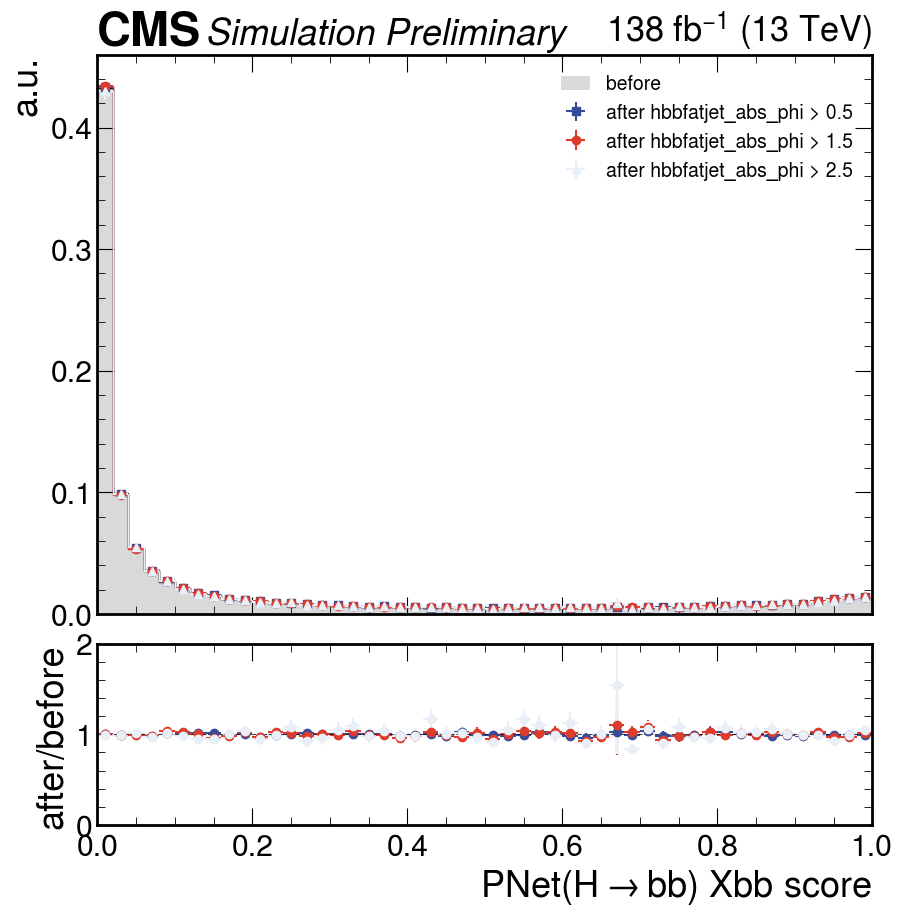

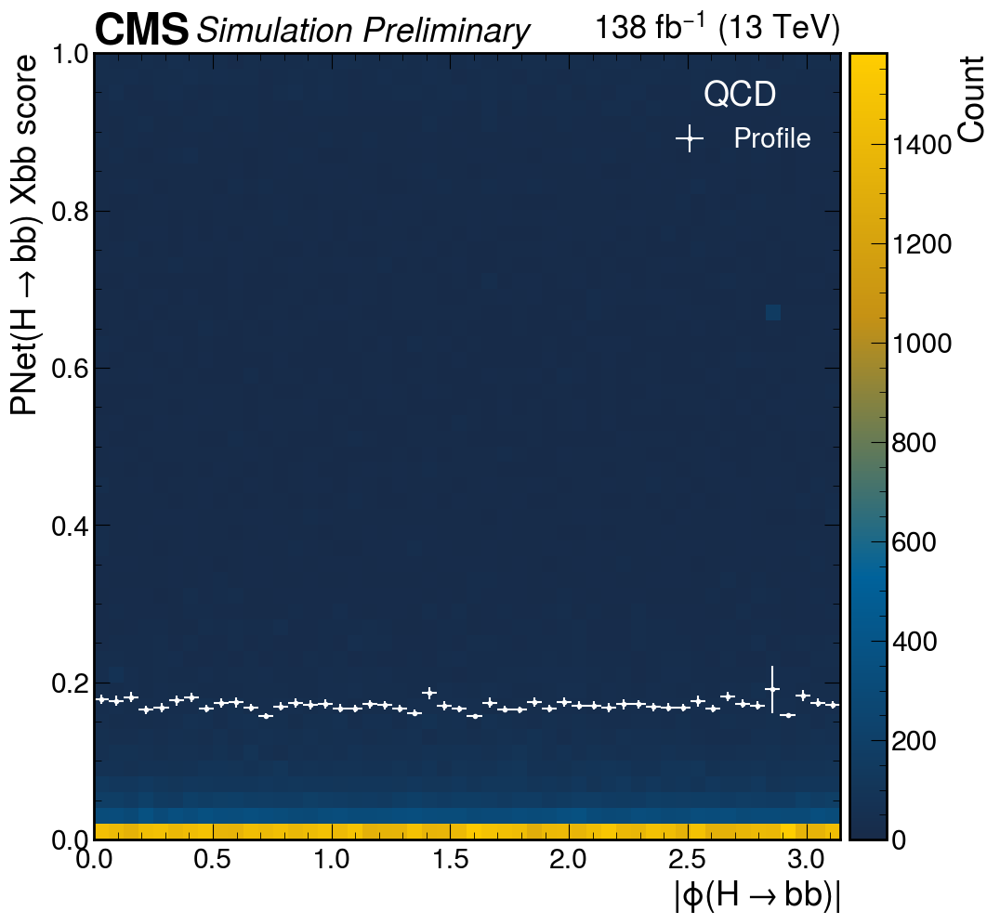

In [29]:
vbsvvh.plot_correlation(
    "hbbfatjet_xbb", np.linspace(0, 1, 51),
    selections=[
        "hbbfatjet_abs_phi > 0.5",
        "hbbfatjet_abs_phi > 1.5",
        "hbbfatjet_abs_phi > 2.5"
    ],
    base_selection="objsel",
    x_label=r"PNet$(H\rightarrow bb)$ Xbb score"
)
vbsvvh.plot_correlation2D(
    "hbbfatjet_xbb", "hbbfatjet_abs_phi", 
    np.linspace(0, 1.0, 51), np.linspace(0, np.pi, 51),
    flip=True, sample="QCD",
    x_label=r"PNet$(H\rightarrow bb)$ Xbb score",
    y_label=r"$|\phi(H\rightarrow bb)|$",
)

Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/hbbfatjet_xbb_correlations_objsel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/nopnetfix/opt/correlation2D_hbbfatjet_xbb_hbbfatjet_mass_1Dprofile_QCD_flipped.pdf


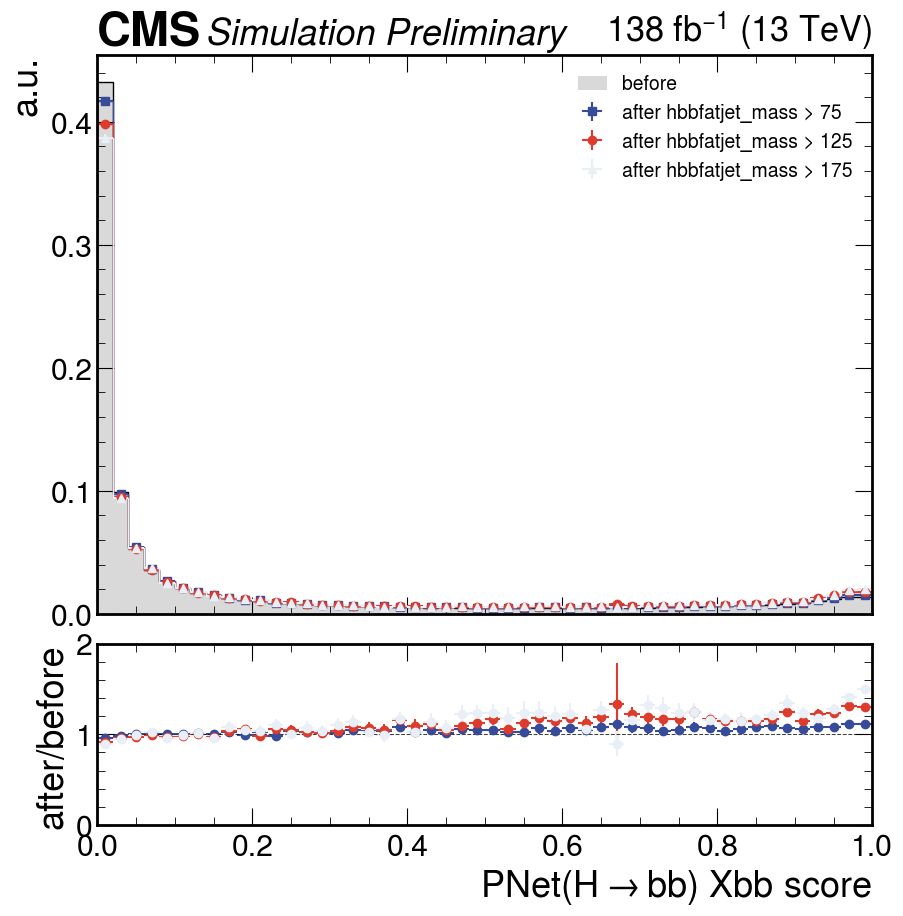

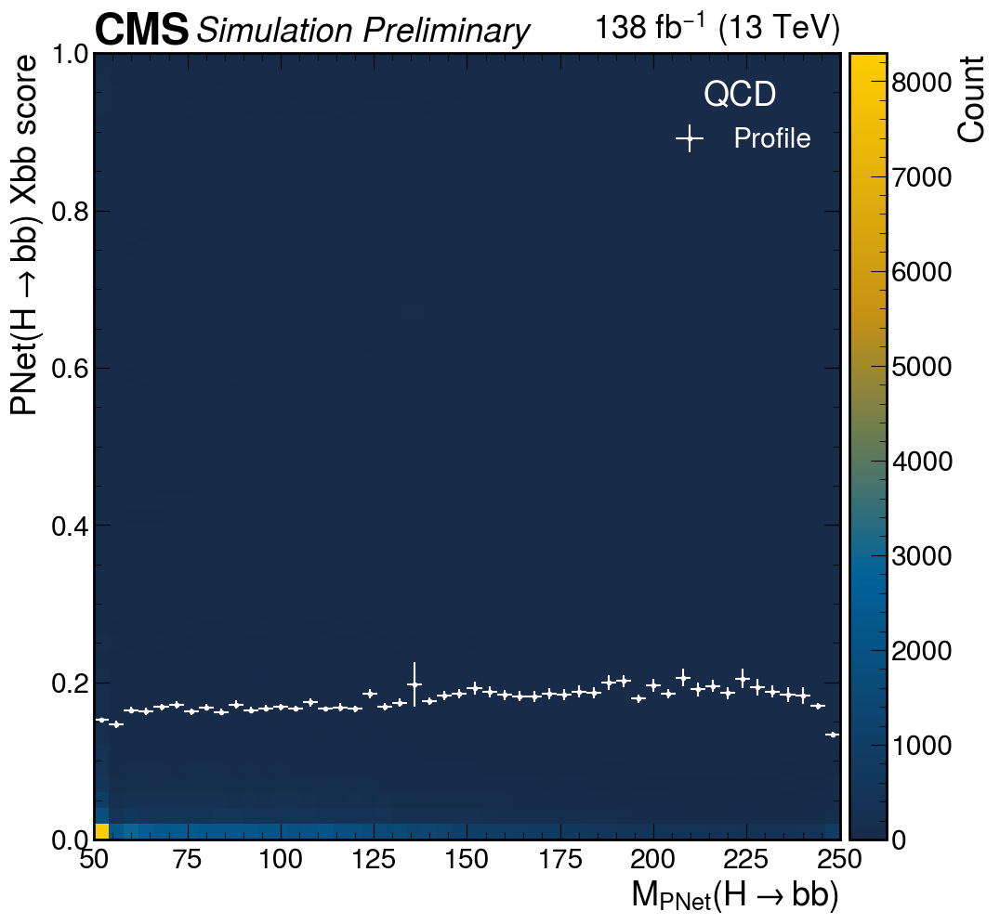

In [30]:
vbsvvh.plot_correlation(
    "hbbfatjet_xbb", np.linspace(0, 1, 51),
    selections=[
        "hbbfatjet_mass > 75",
        "hbbfatjet_mass > 125",
        "hbbfatjet_mass > 175",
    ],
    base_selection="objsel",
    x_label=r"PNet$(H\rightarrow bb)$ Xbb score"
)
vbsvvh.plot_correlation2D(
    "hbbfatjet_xbb", "hbbfatjet_mass", 
    np.linspace(0, 1.0, 51), np.linspace(50, 250, 51),
    flip=True, sample="QCD",
    x_label=r"PNet$(H\rightarrow bb)$ Xbb score",
    y_label=r"$M_{PNet}(H\rightarrow bb)$",
)

In [31]:
# Rescale QCD integral after applying the Preselection
vbsvvh.make_selection("presel")

if TAG != "nopnetfix":
    print("normalizing QCD to (data - non-QCD)")
    bkg_count = vbsvvh.bkg_count()
    qcd_count = vbsvvh.sample_count("QCD")
    data_count = vbsvvh.data_count()

    vbsvvh.df.loc[vbsvvh.df.name == "QCD", "event_weight"] *= (data_count - (bkg_count - qcd_count))/(qcd_count)
    
get_cutflow_row(["presel"])

QCD,TTHad,TT1L,TTW,TTH,SingleTop,Bosons,TotalBkg,TotalSig
4346.273082932983,1455.7867463615214,178.8932496748415,25.466564246888098,9.2822284645755,160.9131657435251,359.6508747002764,6536.265912124611,11.708093741993547


In [32]:
history = {}

def plot_many(plot_tuples, sel="obj_sel", norm=False, sig_scale=0, year=None, ratio_ylim=[0, 2], logy=False):
    if year:
        sel = f"{sel} and abs(year) == {year}"
    for var, bins, label in plot_tuples:
        if year:
            if year == 2016:
                vbsvvh.lumi = 36.33
            elif year == 2017:
                vbsvvh.lumi = 41.48
            elif year == 2018:
                vbsvvh.lumi = 59.83
        
        plot_hash = hash((var, sel, norm, year))
        plot_subhash = hash((",".join(bins.astype(str)), sig_scale, label, logy))
        if history.get(plot_hash, None) != plot_subhash:
            vbsvvh.plot_sig_vs_bkg(
                var, bins, selection=sel, norm=norm, x_label=label, sig_scale=sig_scale, stacked=True, logy=logy
            )
            history[plot_hash] = plot_subhash
        else:
            print("This plot has already been plotted during the runtime of this kernel")
            
        if year:
            vbsvvh.lumi = 138

In [33]:
vbsvvh.df["dphi_VV"] = np.arccos(np.cos(vbsvvh.df.ld_vqqfatjet_phi - vbsvvh.df.tr_vqqfatjet_phi))
vbsvvh.df["dphi_ldVH"] = np.arccos(np.cos(vbsvvh.df.hbbfatjet_phi - vbsvvh.df.ld_vqqfatjet_phi))
vbsvvh.df["dphi_trVH"] = np.arccos(np.cos(vbsvvh.df.hbbfatjet_phi - vbsvvh.df.tr_vqqfatjet_phi))
vbsvvh.df["dphi_jj"] = np.arccos(np.cos(vbsvvh.df.ld_vbsjet_phi - vbsvvh.df.tr_vbsjet_phi))

Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/opt/ST_sig_vs_bkg_stacked_logy_objsel_and_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/opt/HT_sig_vs_bkg_stacked_logy_objsel_and_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/opt/HT_fat_sig_vs_bkg_stacked_logy_objsel_and_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/opt/MET_sig_vs_bkg_stacked_logy_objsel_and_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/opt/n_jets_sig_vs_bkg_stacked_logy_objsel_and_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/opt/n_fatjets_sig_vs_bkg_stacked_logy_objsel_and_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/opt/M_jj_sig_vs_bkg_stacked_logy_objsel_and_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/opt/abs_deta_jj_sig_vs_bkg_stacked_logy_obj

/home/users/jguiang/projects/vbs/notebooks/utils/analysis.py:574: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots()


Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/opt/ld_vqqfatjet_mass_sig_vs_bkg_stacked_logy_objsel_and_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/opt/tr_vqqfatjet_mass_sig_vs_bkg_stacked_logy_objsel_and_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/opt/hbbfatjet_pt_sig_vs_bkg_stacked_logy_objsel_and_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/opt/ld_vqqfatjet_pt_sig_vs_bkg_stacked_logy_objsel_and_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/opt/tr_vqqfatjet_pt_sig_vs_bkg_stacked_logy_objsel_and_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/opt/hbbfatjet_eta_sig_vs_bkg_stacked_logy_objsel_and_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/pnetfix/opt/ld_vqqfatjet_eta_sig_vs_bkg_stacked_logy_objsel_and_presel.pdf
Wrote plot to /home/users/jguiang/public_

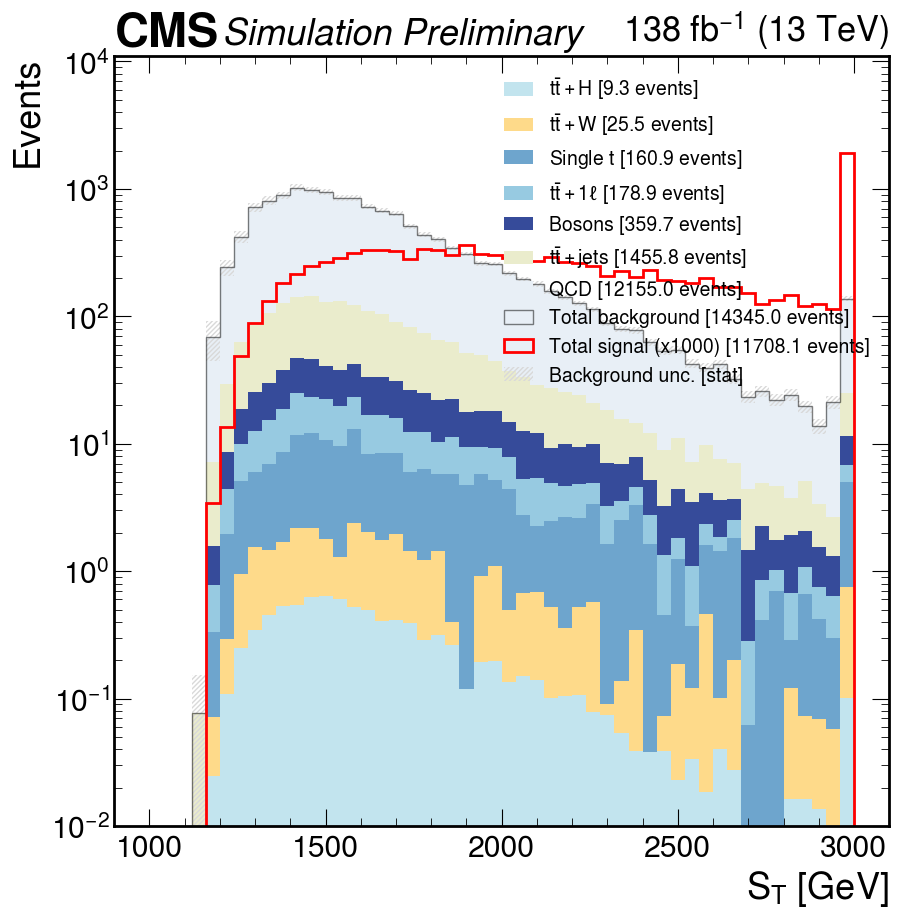

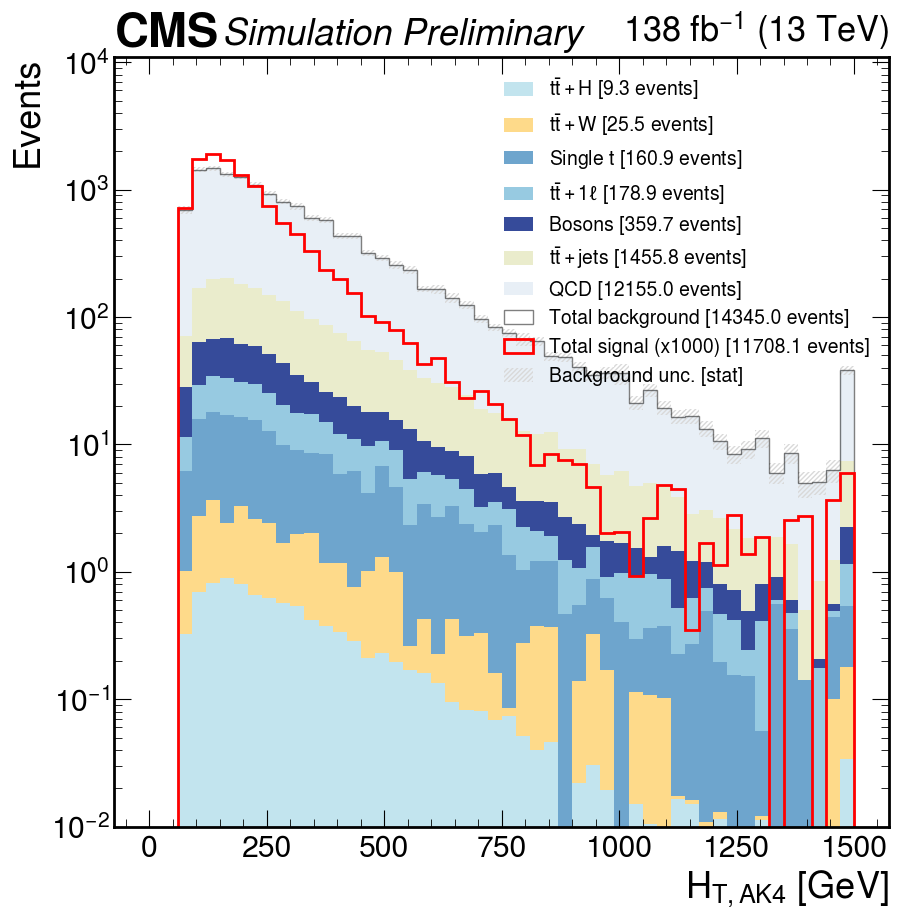

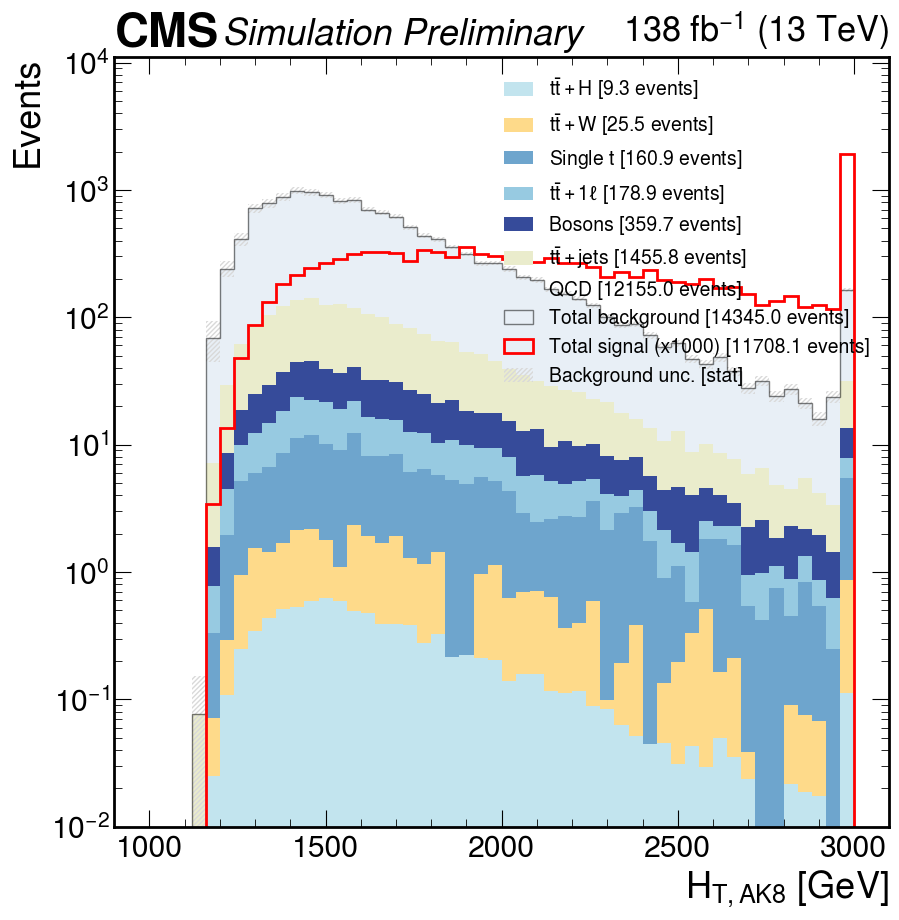

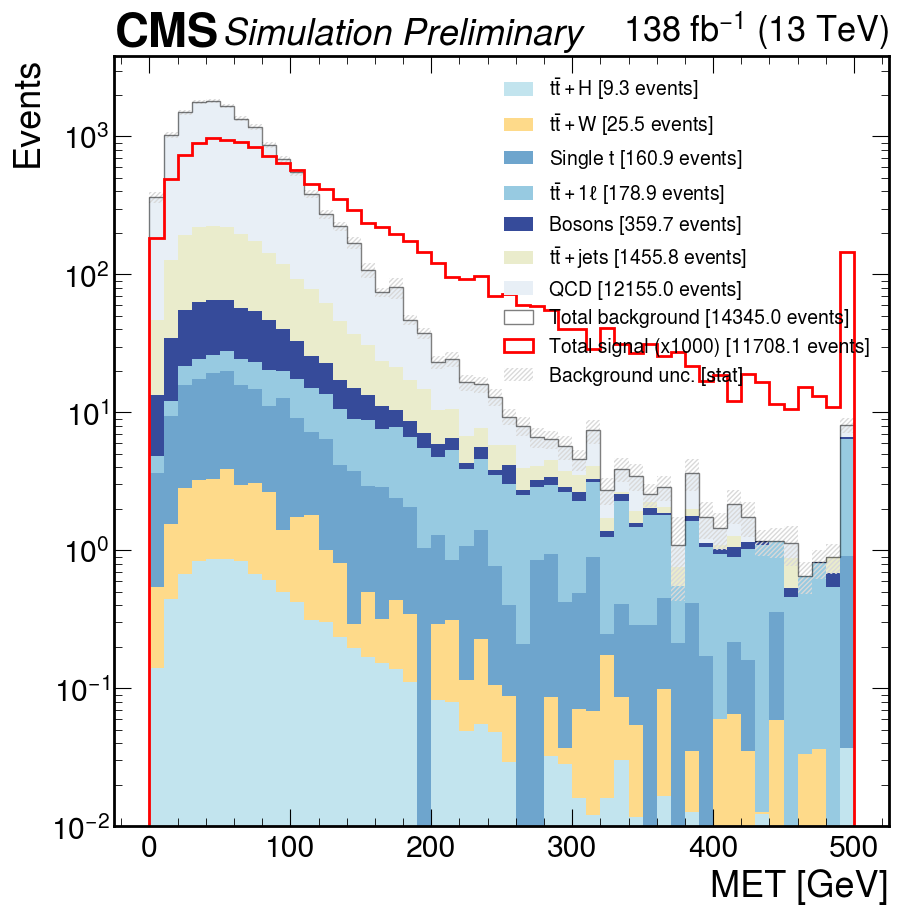

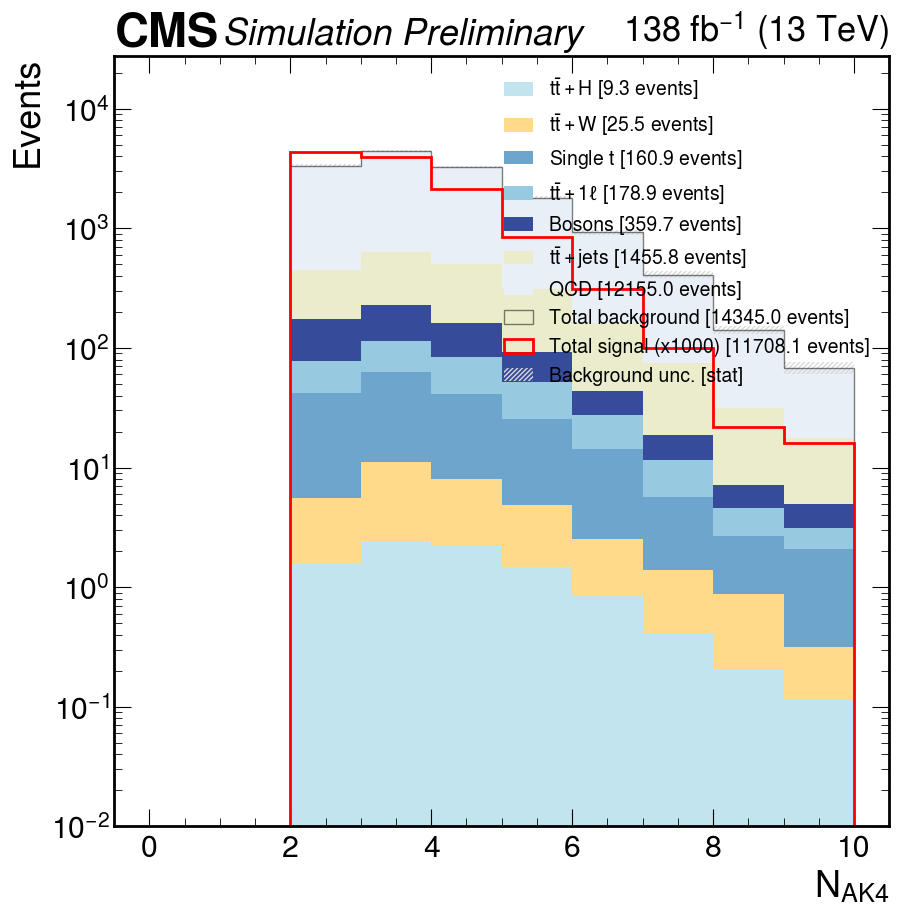

...

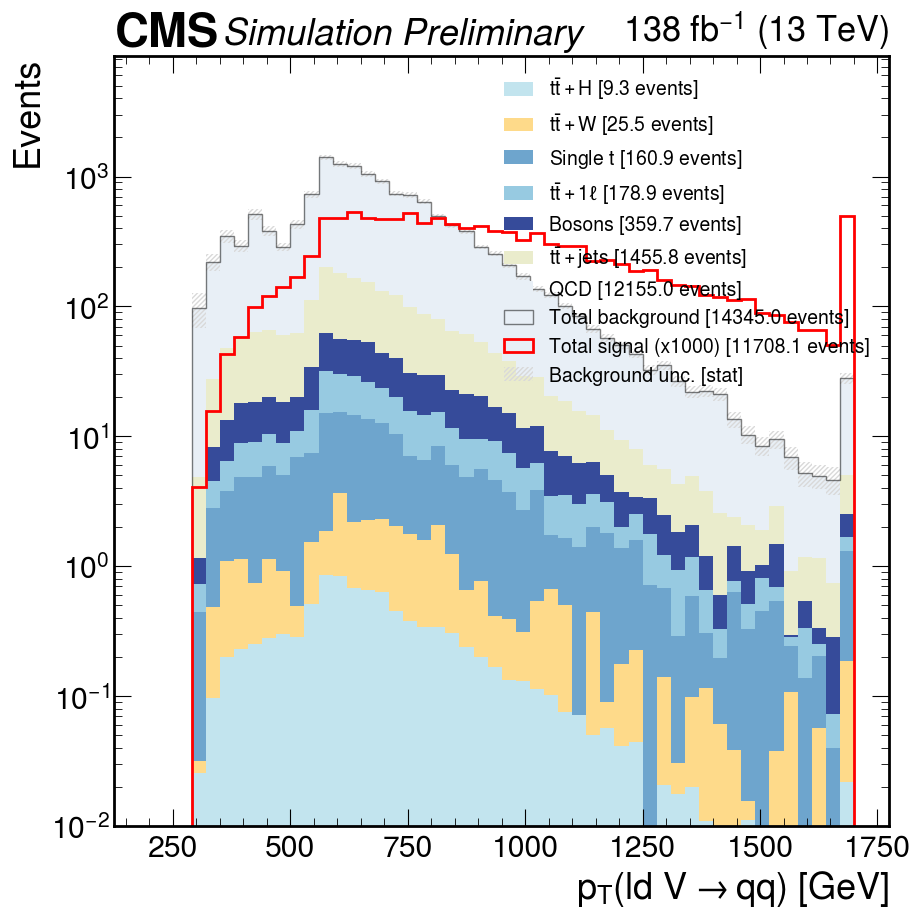

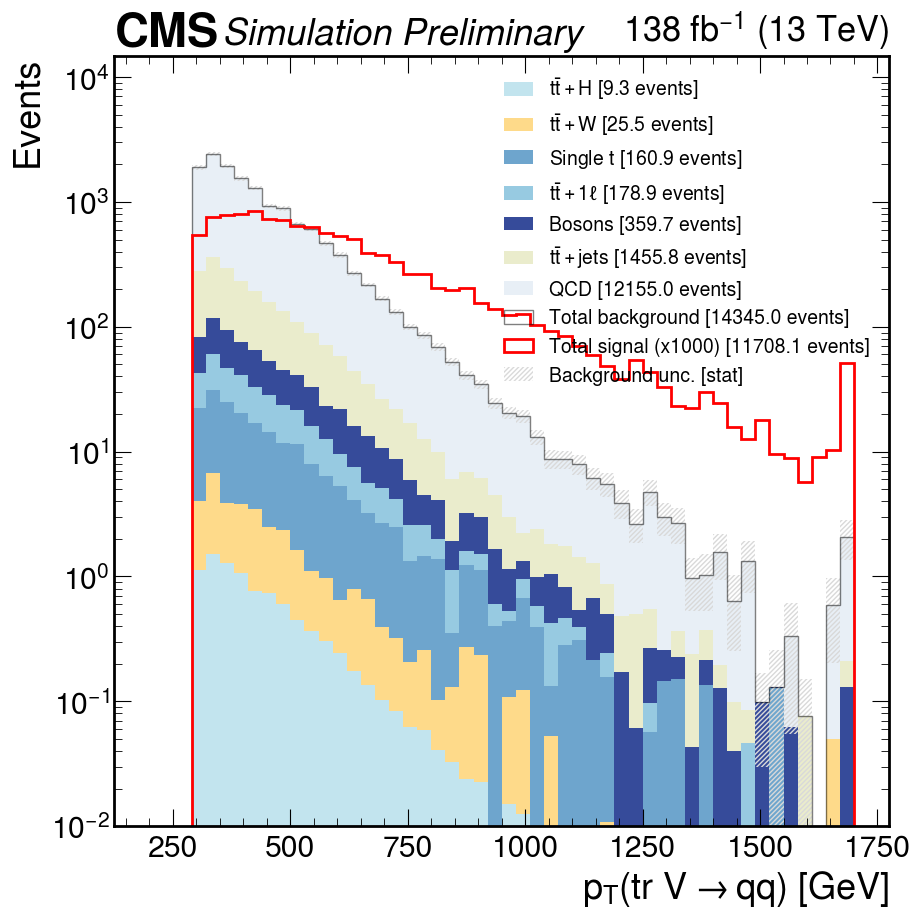

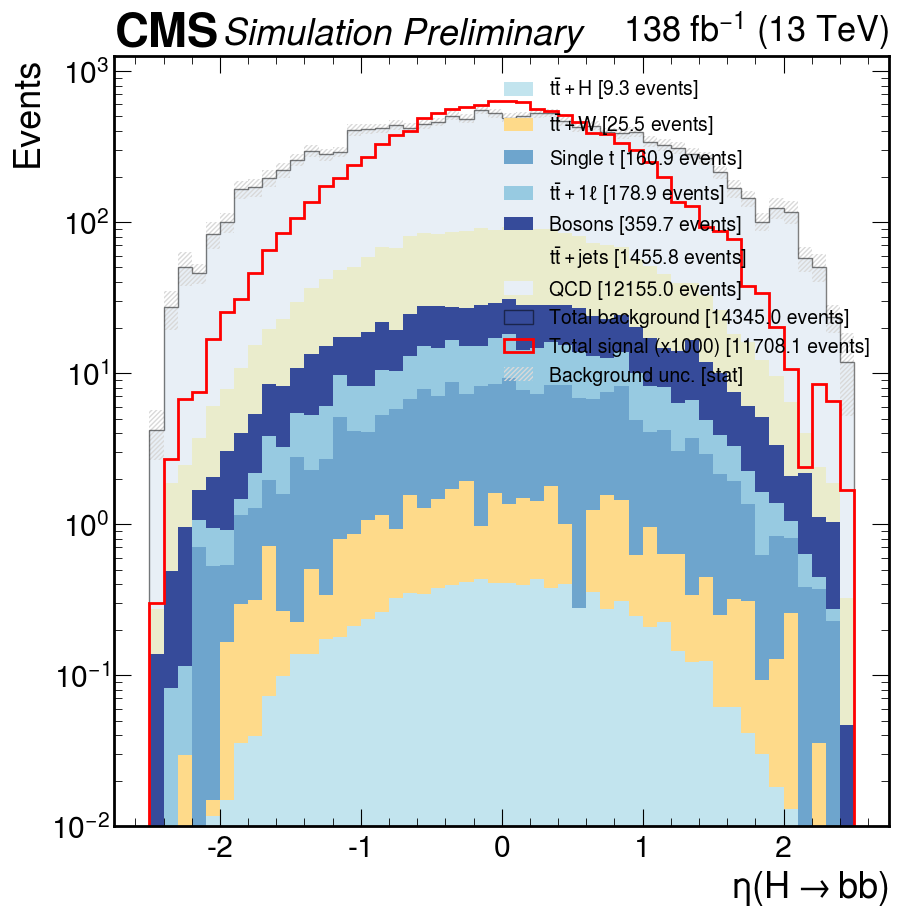

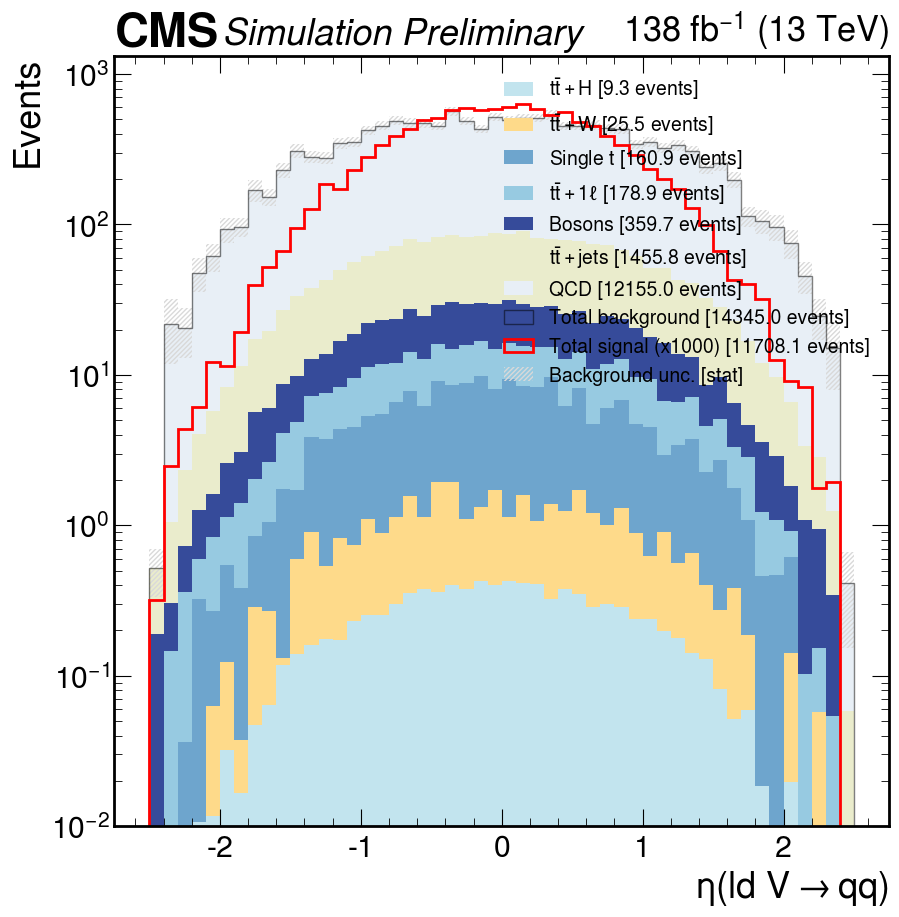

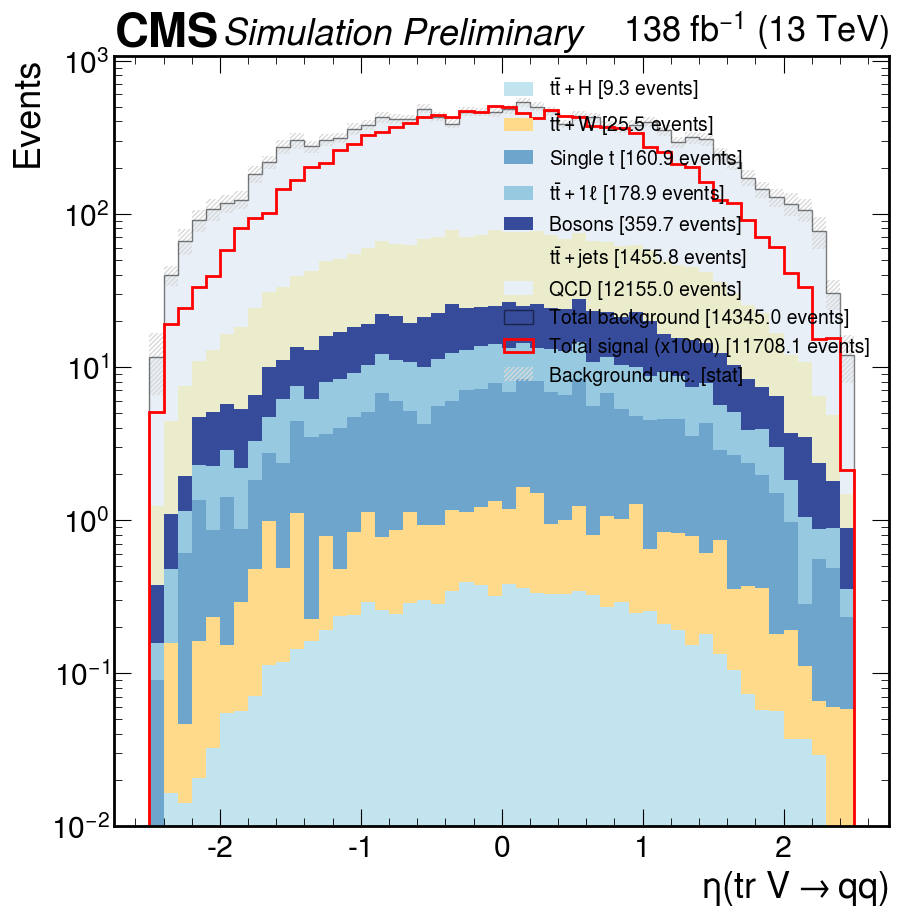

In [17]:
nbins = 50

plot_many(
    [
        # Event-level variables
        ("ST", np.linspace(1000, 3000, nbins+1), r"$S_T$ [GeV]"),
        ("HT", np.linspace(0, 1500, nbins+1), r"$H_{T, AK4}$ [GeV]"),
        ("HT_fat", np.linspace(1000, 3000, nbins+1), r"$H_{T, AK8}$ [GeV]"),
        ("MET", np.linspace(0, 500, nbins+1), "MET [GeV]"),
        ("n_jets", np.linspace(0, 10, 11), r"$N_{AK4}$"),
        ("n_fatjets", np.linspace(0, 10, 11), r"$N_{AK8}$"),
        # VBS variables
        ("M_jj", np.linspace(0, 2000, nbins+1), r"$M_{jj}$ [GeV]"),
        ("abs_deta_jj", np.linspace(0, 10, nbins+1), r"$|\Delta\eta_{jj}|$"),
        ("ld_vbsjet_pt", np.linspace(0, 500, nbins+1), r"$p_T($ld VBS$)$ [GeV]"),
        ("tr_vbsjet_pt", np.linspace(0, 500, nbins+1), r"$p_T($tr VBS$)$ [GeV]"),
        ("ld_vbsjet_eta", np.linspace(-5, 5, nbins+1), r"$\eta($ld VBS$)$"),
        ("tr_vbsjet_eta", np.linspace(-5, 5, nbins+1), r"$\eta($tr VBS$)$"),
        # VVH variables
        ("M_VVH", np.linspace(1000, 5000, nbins+1), r"$M_{VVH}$ [GeV]"),
        ("dphi_VV", np.linspace(0, 4, nbins+1), r"$\Delta\phi($ld $V\rightarrow qq, $tr $V \rightarrow qq)$"),
        ("dphi_ldVH", np.linspace(0, 4, nbins+1), r"$\Delta\phi(H\rightarrow b\bar{b}, $ld $V \rightarrow qq)$"),
        ("dphi_trVH", np.linspace(0, 4, nbins+1), r"$\Delta\phi(H\rightarrow b\bar{b}, $tr $V \rightarrow qq)$"),
        # Fat jet MSD
        ("hbbfatjet_msoftdrop", np.linspace(0, 500, nbins+1), r"$M_{SD}(H\rightarrow bb)$ [GeV]"),
        ("ld_vqqfatjet_msoftdrop", np.linspace(0, 500, nbins+1), r"$M_{SD}($ld $V\rightarrow qq)$ [GeV]"),
        ("tr_vqqfatjet_msoftdrop", np.linspace(0, 500, nbins+1), r"$M_{SD}($tr $V\rightarrow qq)$ [GeV]"),
        # Fat jet ParticleNet mass
        ("hbbfatjet_mass", np.linspace(0, 500, nbins+1), r"$M_{PNet}(H\rightarrow bb)$ [GeV]"),
        ("ld_vqqfatjet_mass", np.linspace(0, 500, nbins+1), r"$M_{PNet}($ld $V\rightarrow qq)$ [GeV]"),
        ("tr_vqqfatjet_mass", np.linspace(0, 500, nbins+1), r"$M_{PNet}($tr $V\rightarrow qq)$ [GeV]"),
        # Fat jet pt
        ("hbbfatjet_pt", np.linspace(200, 1700, nbins+1), r"$p_T(H\rightarrow bb)$ [GeV]"),
        ("ld_vqqfatjet_pt", np.linspace(200, 1700, nbins+1), r"$p_T($ld $V\rightarrow qq)$ [GeV]"),
        ("tr_vqqfatjet_pt", np.linspace(200, 1700, nbins+1), r"$p_T($tr $V\rightarrow qq)$ [GeV]"),
        # Fat jet eta
        ("hbbfatjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta(H\rightarrow bb)$"),
        ("ld_vqqfatjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta($ld $V\rightarrow qq)$"),
        ("tr_vqqfatjet_eta", np.linspace(-2.5, 2.5, nbins+1), r"$\eta($tr $V\rightarrow qq)$"),
    ],
    sel="objsel and presel",
    norm=False,
    sig_scale=1000,
    logy=True
)

Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/abcdnet/opt/deta_jj_correlations_SR_like.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/abcdnet/opt/deta_jj_correlations_SR_like_noXbb.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/abcdnet/opt/deta_jj_sig_vs_bkg_stacked_norm_SR_like_and_bdt_gt_0p6.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/abcdnet/opt/deta_jj_sig_vs_bkg_stacked_norm_SR_like_and_bdt_leq_0p6.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/abcdnet/opt/deta_jj_sig_vs_bkg_stacked_norm_SR_like_noXbb_and_bdt_gt_0p6.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/abcdnet/opt/deta_jj_sig_vs_bkg_stacked_norm_SR_like_noXbb_and_bdt_leq_0p6.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/abcdnet/opt/deta_jj_sig_vs_bkg_stacked_norm_SR_like_noXbb_and_bdt_gt_0p6.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/abcdnet/opt/deta_jj_sig_v

<AxesSubplot:xlabel='$|\\Delta\\eta_{jj}|$', ylabel='Events'>

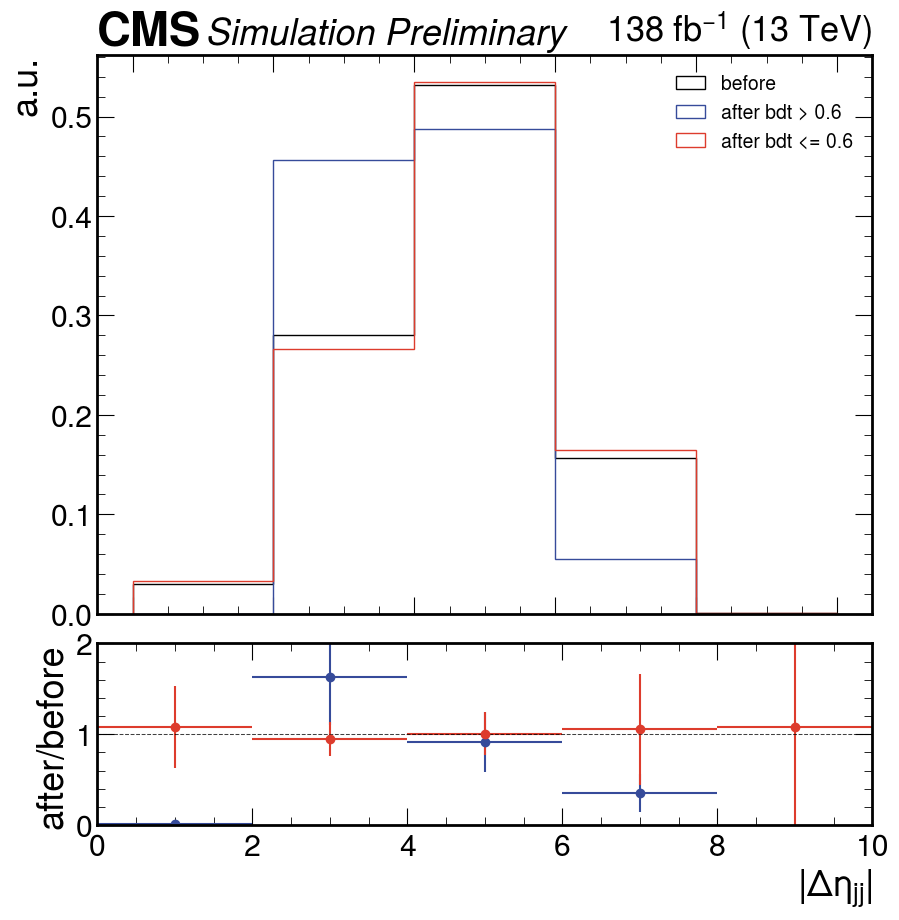

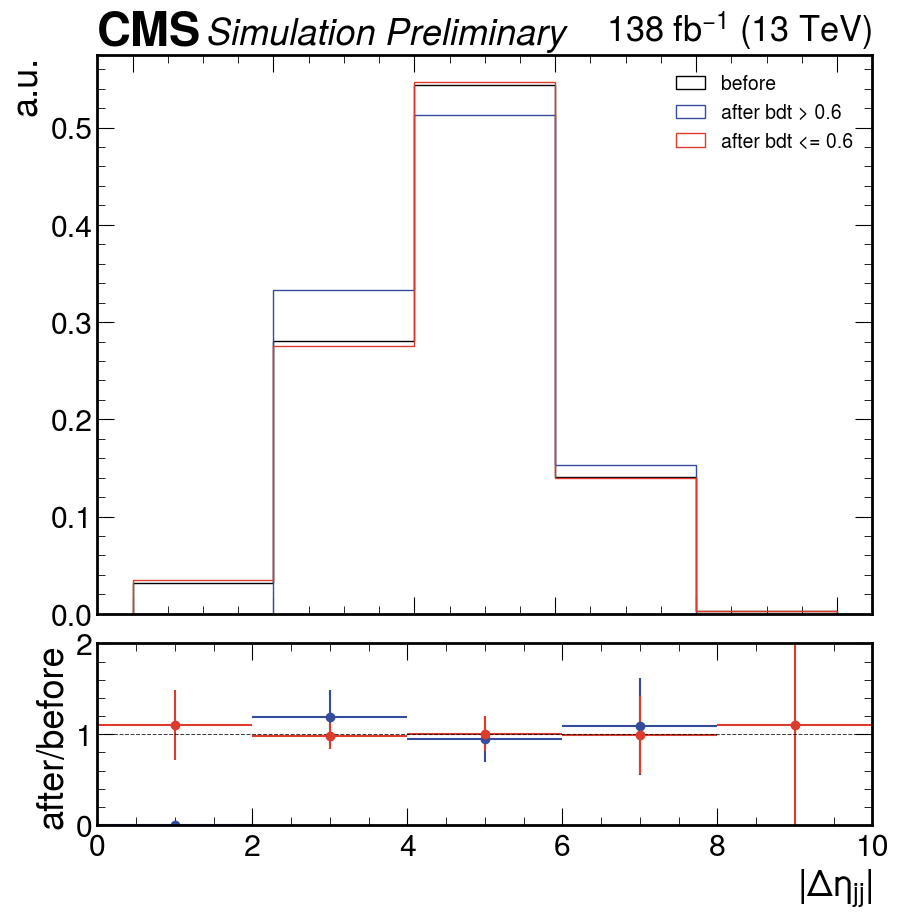

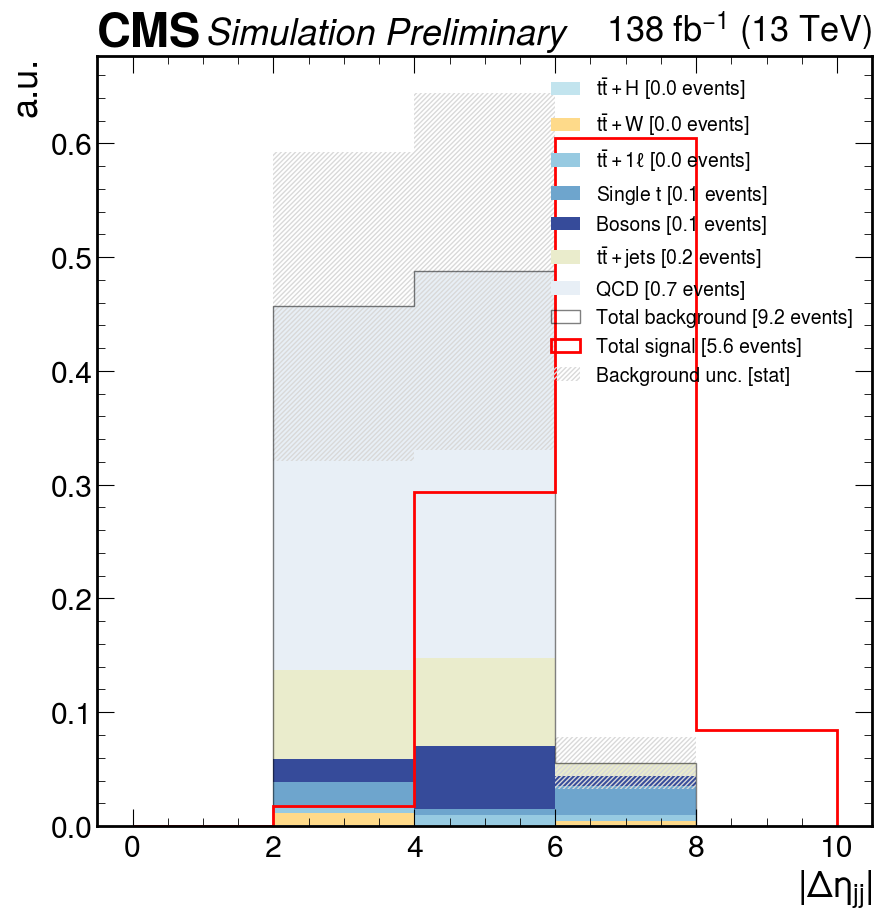

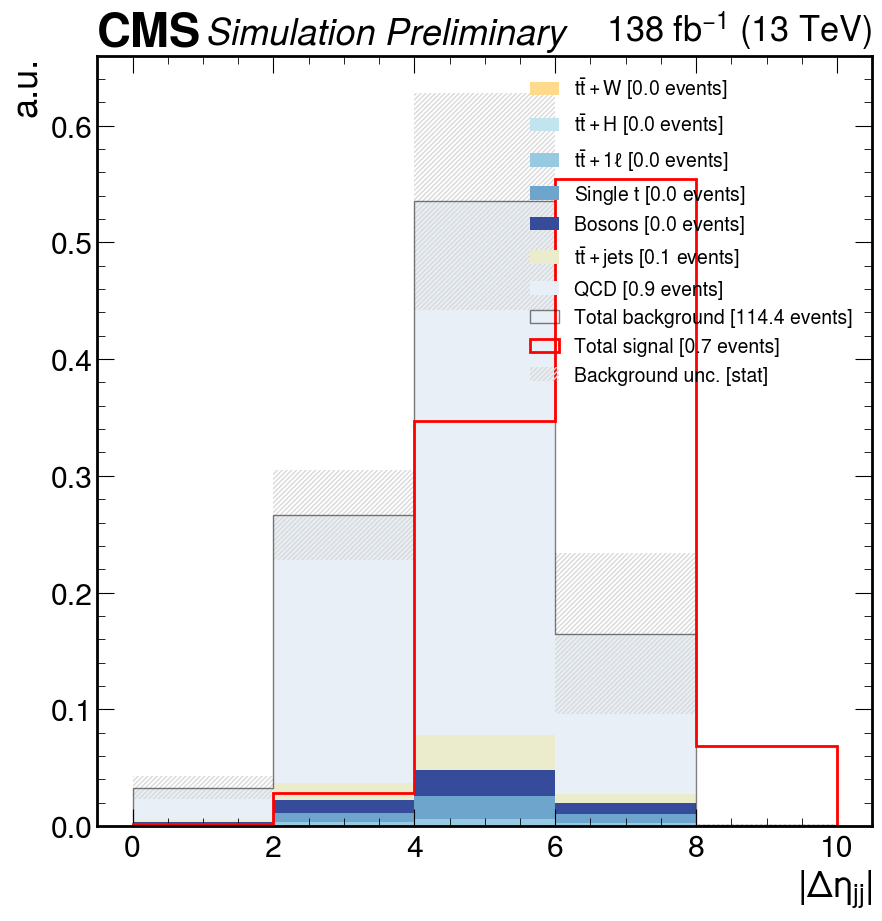

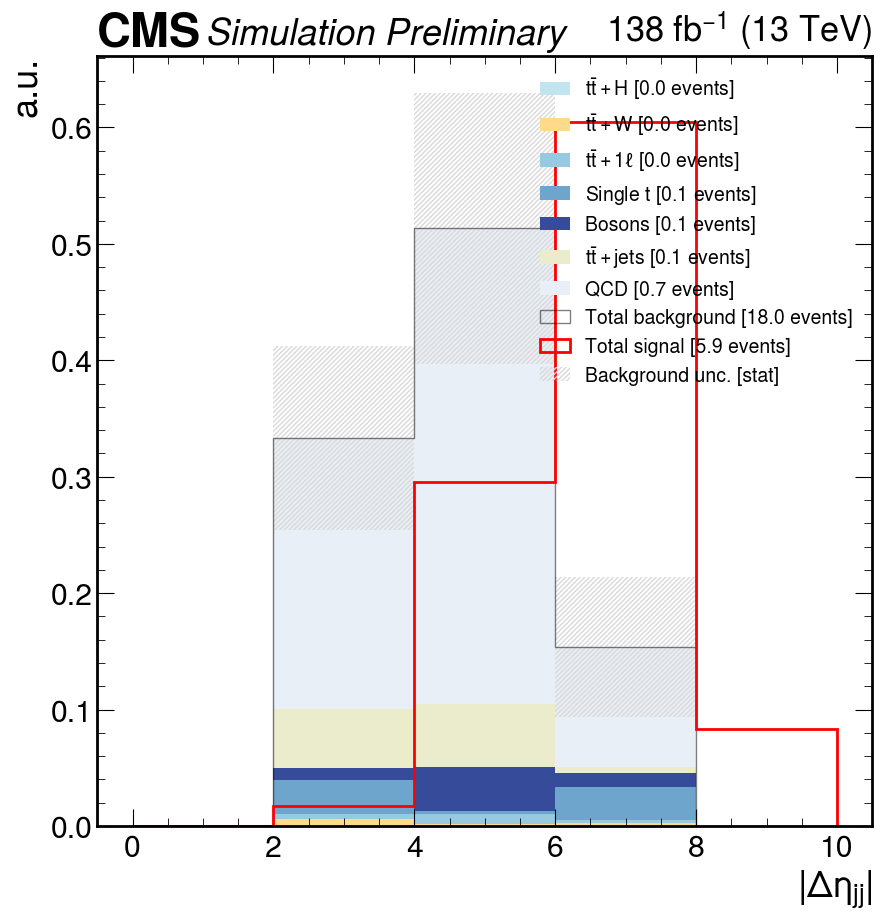

...

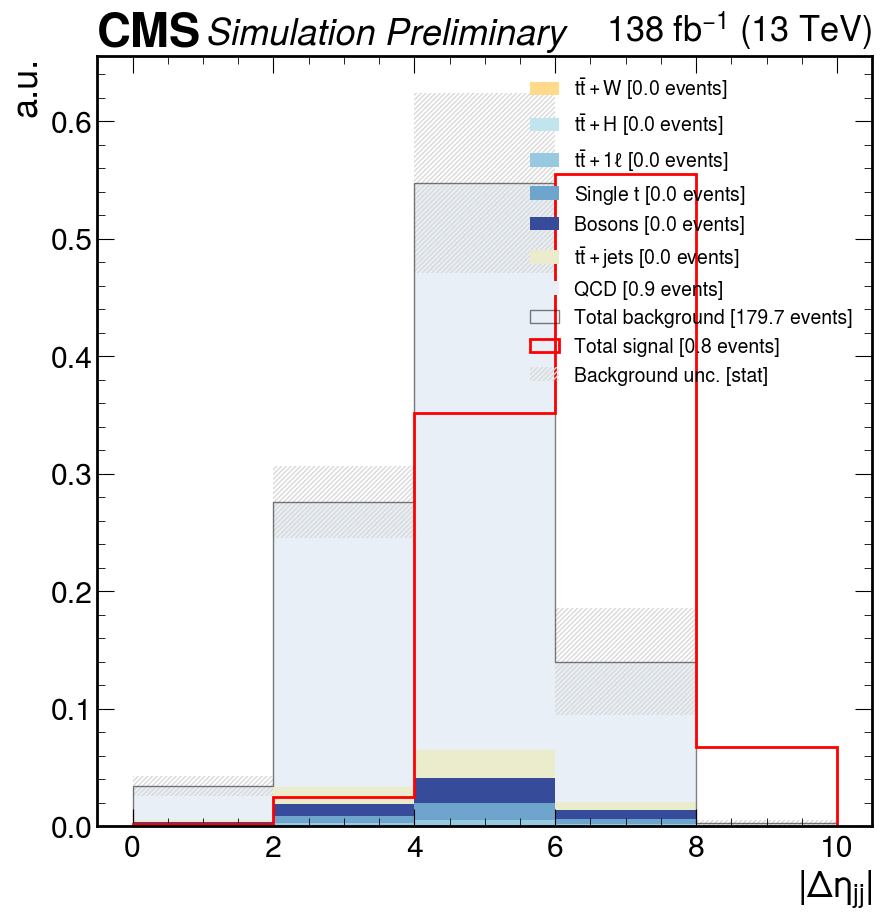

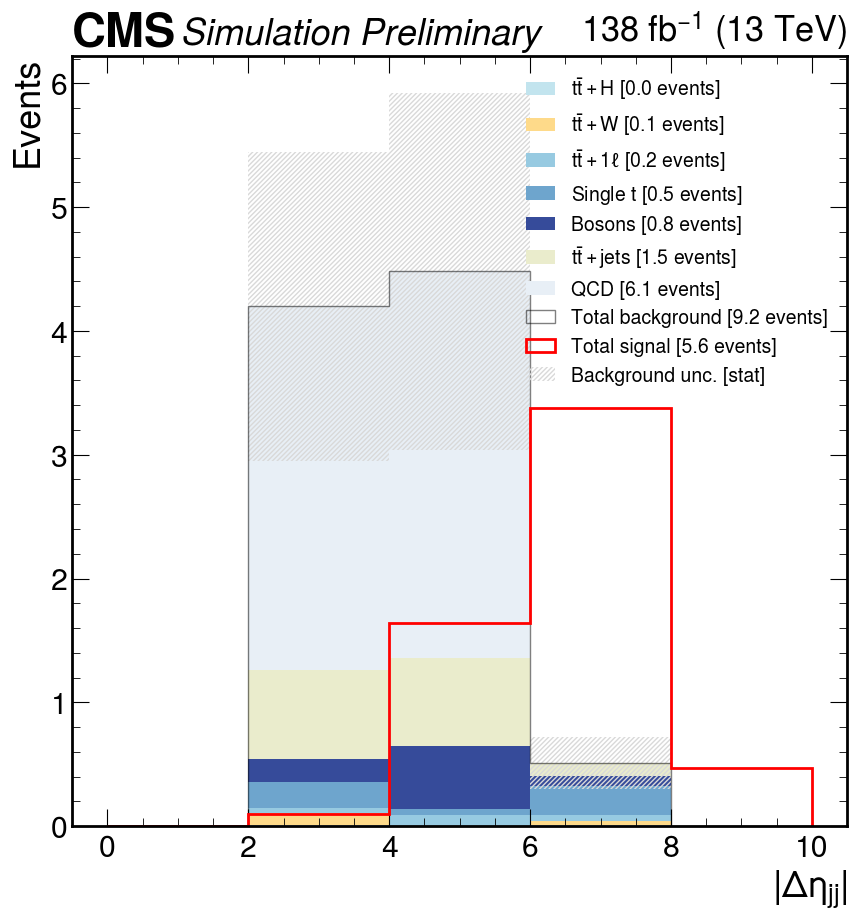

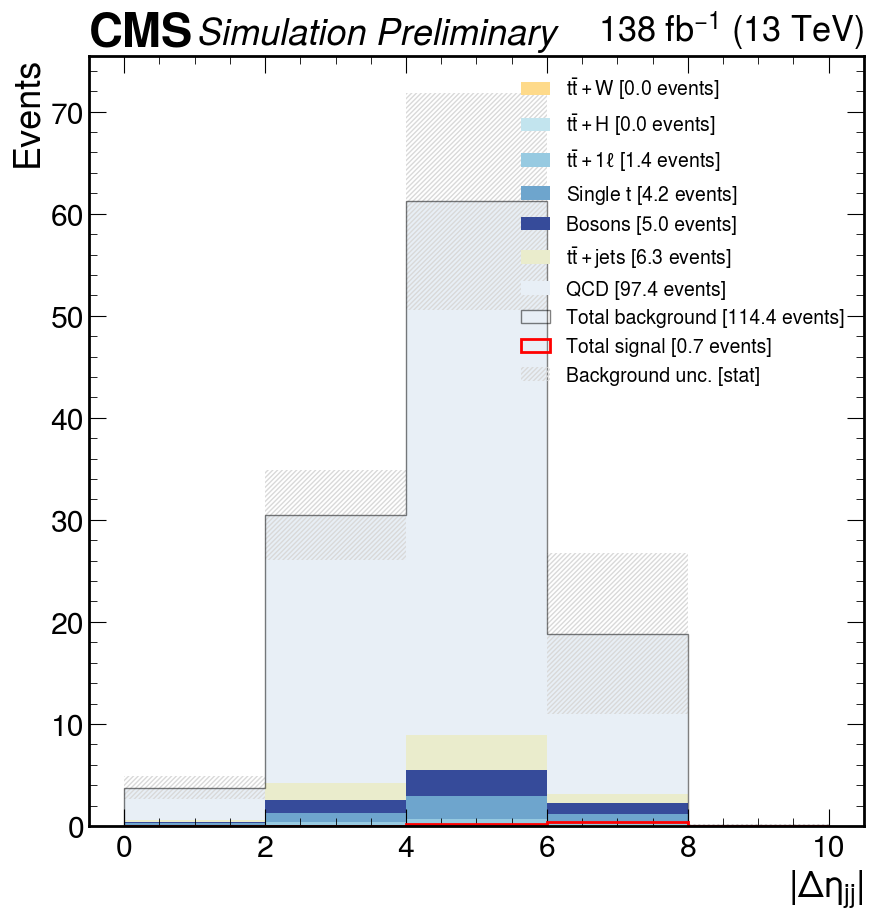

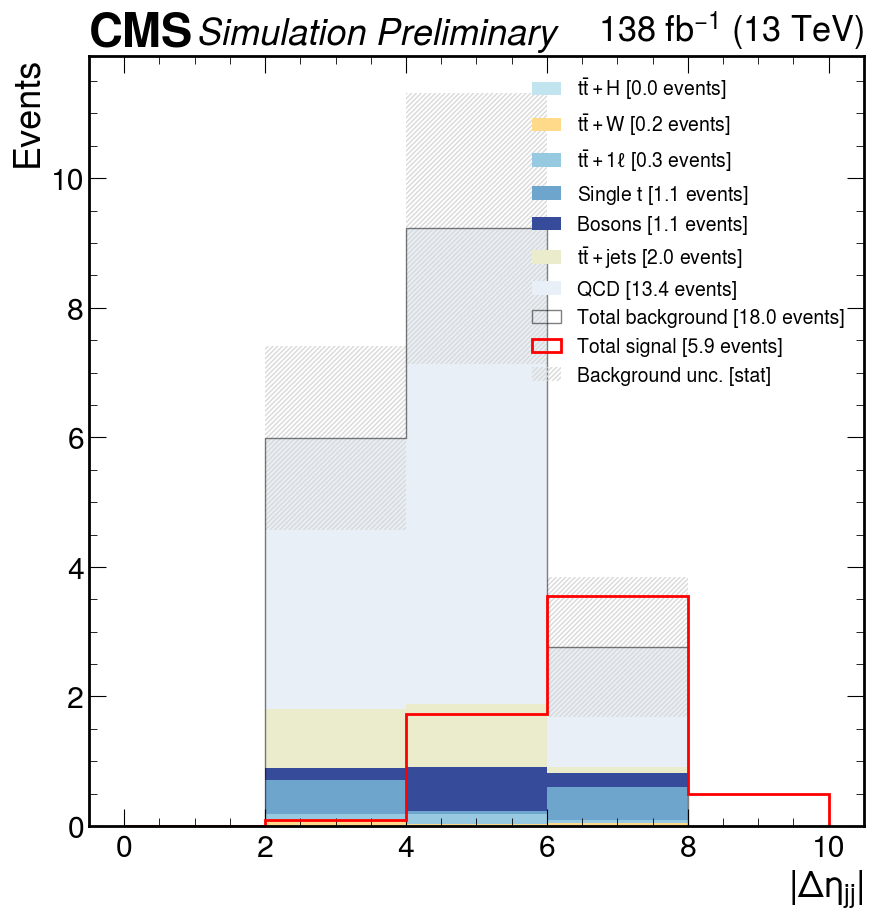

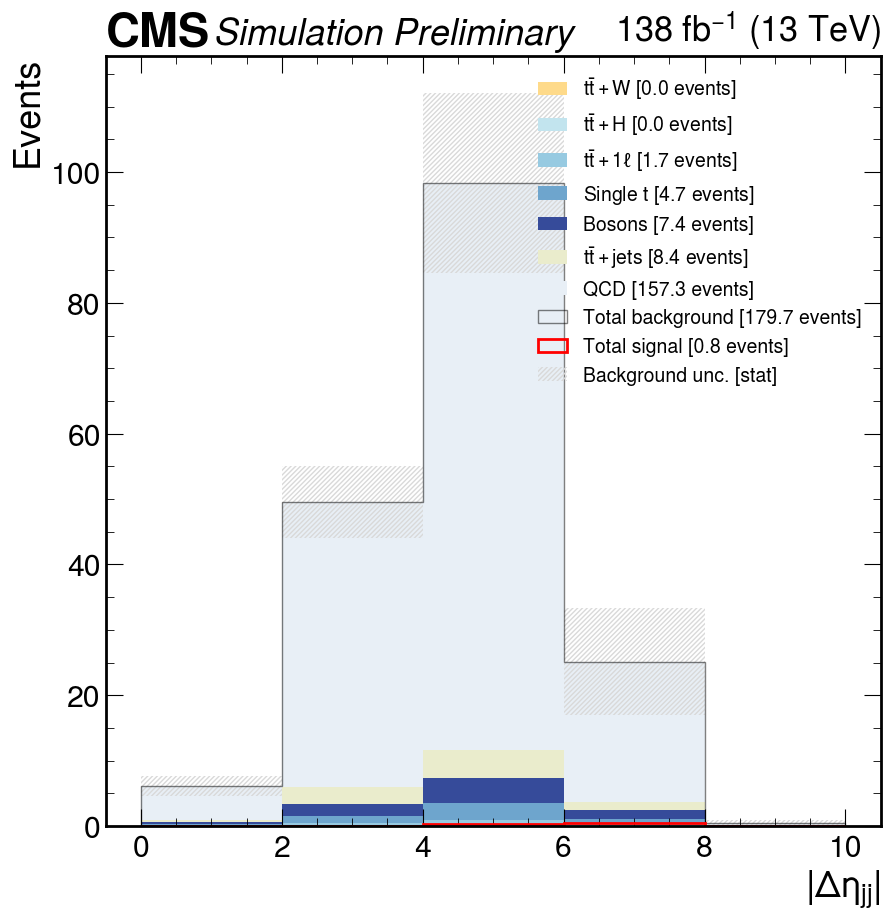

In [18]:
vbsvvh.df["SR_like"] = vbsvvh.df.eval(
    "obj_sel and qcdnorm_CR"
    + " and hbbfatjet_xbb > 0.6"
    + " and ld_vqqfatjet_xwqq > 0.6"
    + " and tr_vqqfatjet_xwqq > 0.65"
    + " and ST > 1300"
    + " and hbbfatjet_mass < 150"
    + " and ld_vqqfatjet_mass < 120 and tr_vqqfatjet_mass < 120"
    + " and M_jj > 600"
)

vbsvvh.df["SR_like_noXbb"] = vbsvvh.df.eval(
    "obj_sel and qcdnorm_CR"
#     + " and hbbfatjet_xbb > 0.6"
    + " and ld_vqqfatjet_xwqq > 0.6"
    + " and tr_vqqfatjet_xwqq > 0.65"
    + " and ST > 1300"
    + " and hbbfatjet_mass < 150"
    + " and ld_vqqfatjet_mass < 120 and tr_vqqfatjet_mass < 120"
    + " and M_jj > 600"
)

vbsvvh.plot_correlation(
    "deta_jj", 
    np.linspace(0, 10, 6),  
    selections=[
        "bdt > 0.6",
        "bdt <= 0.6"
    ], 
    base_selection="SR_like",
    transf=abs,
    x_label=r"$|\Delta\eta_{jj}|$"
);

vbsvvh.plot_correlation(
    "deta_jj", 
    np.linspace(0, 10, 6),  
    selections=[
        "bdt > 0.6",
        "bdt <= 0.6"
    ], 
    base_selection="SR_like_noXbb",
    transf=abs,
    x_label=r"$|\Delta\eta_{jj}|$"
);


vbsvvh.plot_sig_vs_bkg(
    "deta_jj", np.linspace(0, 10, 6), 
    selection=f"SR_like and bdt > 0.6",
    transf=abs,
    x_label=r"$|\Delta\eta_{jj}|$",
    stacked=True,
    norm=True
)
vbsvvh.plot_sig_vs_bkg(
    "deta_jj", np.linspace(0, 10, 6), 
    selection=f"SR_like and bdt <= 0.6",
    transf=abs,
    x_label=r"$|\Delta\eta_{jj}|$",
    stacked=True,
    norm=True
)
vbsvvh.plot_sig_vs_bkg(
    "deta_jj", np.linspace(0, 10, 6), 
    selection=f"SR_like_noXbb and bdt > 0.6",
    transf=abs,
    x_label=r"$|\Delta\eta_{jj}|$",
    stacked=True,
    norm=True
)
vbsvvh.plot_sig_vs_bkg(
    "deta_jj", np.linspace(0, 10, 6), 
    selection=f"SR_like_noXbb and bdt <= 0.6",
    transf=abs,
    x_label=r"$|\Delta\eta_{jj}|$",
    stacked=True,
    norm=True
)


vbsvvh.plot_sig_vs_bkg(
    "deta_jj", np.linspace(0, 10, 6), 
    selection=f"SR_like_noXbb and bdt > 0.6",
    transf=abs,
    x_label=r"$|\Delta\eta_{jj}|$",
    stacked=True,
    norm=True
)
vbsvvh.plot_sig_vs_bkg(
    "deta_jj", np.linspace(0, 10, 6), 
    selection=f"SR_like_noXbb and bdt <= 0.6",
    transf=abs,
    x_label=r"$|\Delta\eta_{jj}|$",
    stacked=True,
    norm=True
)


vbsvvh.plot_sig_vs_bkg(
    "deta_jj", np.linspace(0, 10, 6), 
    selection=f"SR_like and bdt > 0.6",
    transf=abs,
    x_label=r"$|\Delta\eta_{jj}|$",
    stacked=True,
    norm=False
)
vbsvvh.plot_sig_vs_bkg(
    "deta_jj", np.linspace(0, 10, 6), 
    selection=f"SR_like and bdt <= 0.6",
    transf=abs,
    x_label=r"$|\Delta\eta_{jj}|$",
    stacked=True,
    norm=False
)
vbsvvh.plot_sig_vs_bkg(
    "deta_jj", np.linspace(0, 10, 6), 
    selection=f"SR_like_noXbb and bdt > 0.6",
    transf=abs,
    x_label=r"$|\Delta\eta_{jj}|$",
    stacked=True,
    norm=False
)
vbsvvh.plot_sig_vs_bkg(
    "deta_jj", np.linspace(0, 10, 6), 
    selection=f"SR_like_noXbb and bdt <= 0.6",
    transf=abs,
    x_label=r"$|\Delta\eta_{jj}|$",
    stacked=True,
    norm=False
)

Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/main/opt/ST_sig_vs_bkg_stacked_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/main/opt/M_jj_sig_vs_bkg_stacked_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/main/opt/deta_jj_sig_vs_bkg_stacked_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/main/opt/hbbfatjet_mass_sig_vs_bkg_stacked_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/main/opt/ld_vqqfatjet_mass_sig_vs_bkg_stacked_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/main/opt/tr_vqqfatjet_mass_sig_vs_bkg_stacked_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/main/opt/hbbfatjet_msoftdrop_sig_vs_bkg_stacked_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/main/opt/ld_vqqfatjet_msoftdrop_sig_vs_bkg_stacked_bdt_presel.pdf
Wrote plot to /home/users/jguiang/public_h

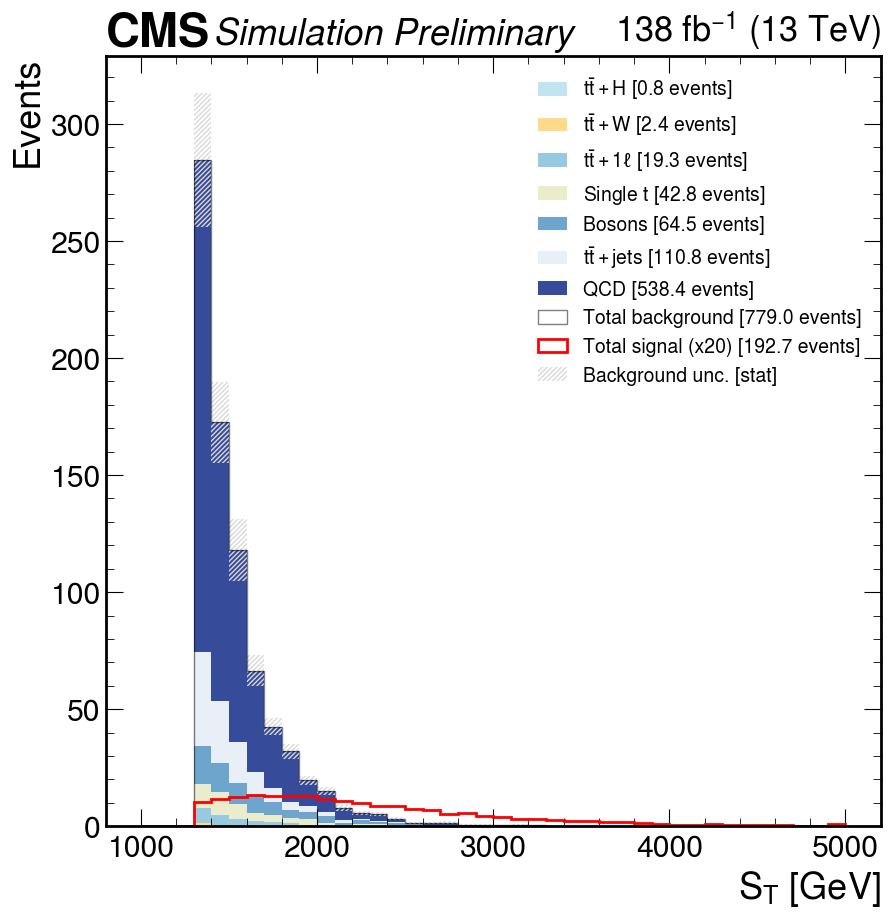

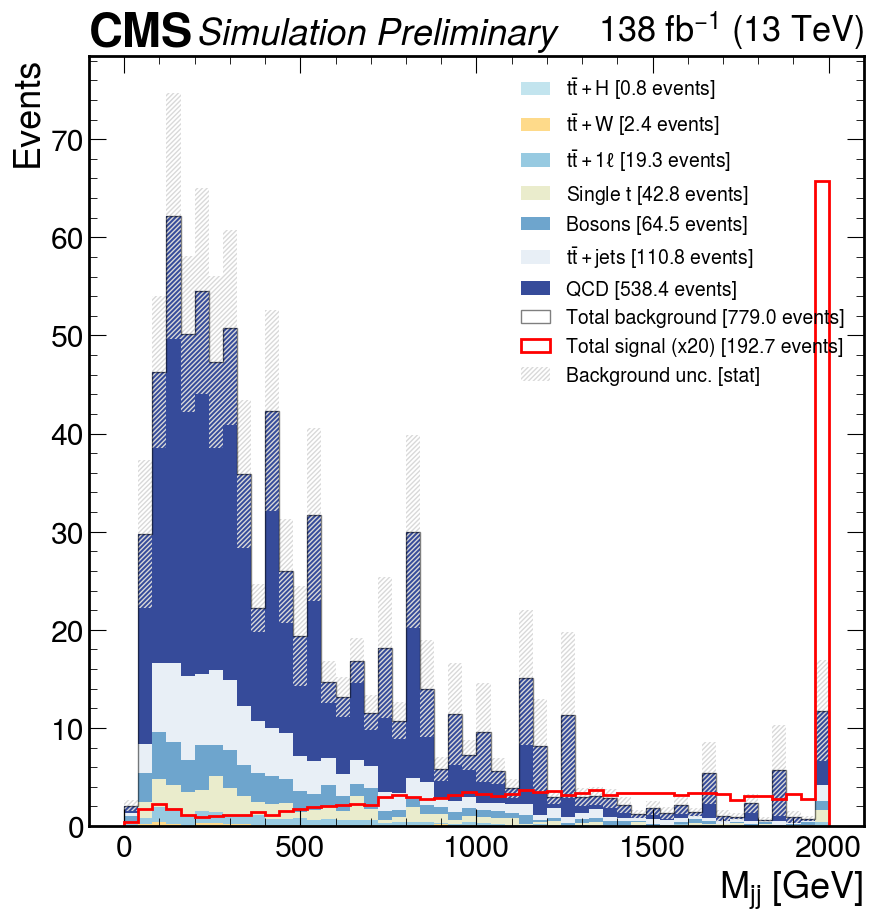

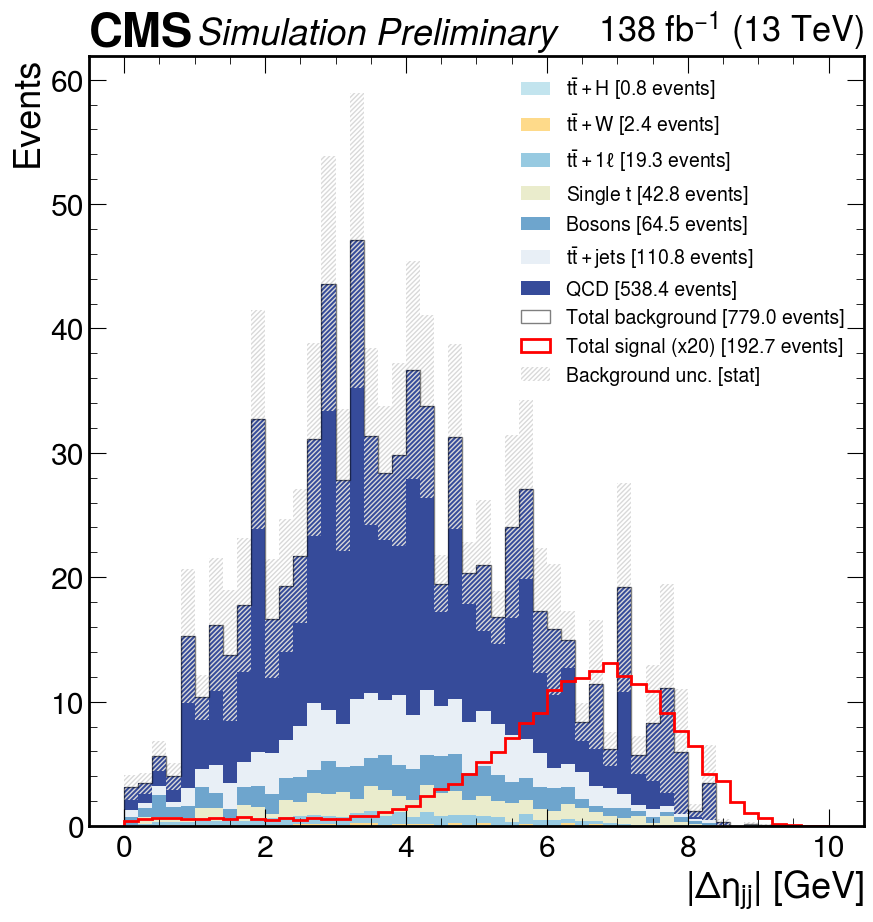

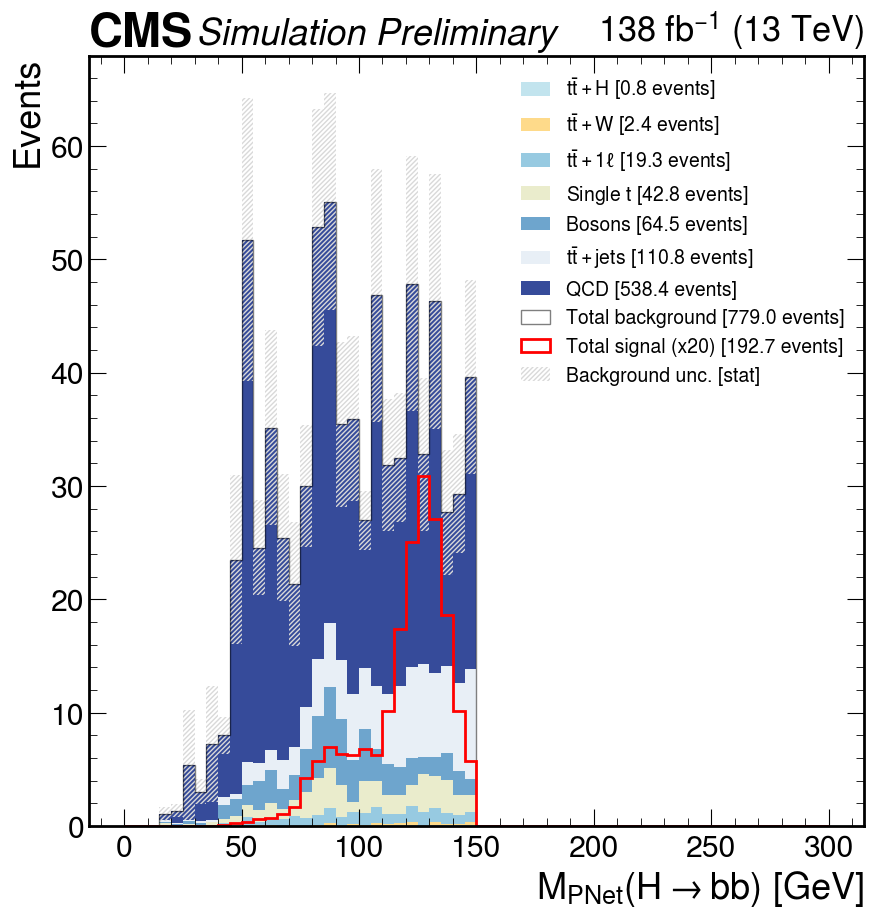

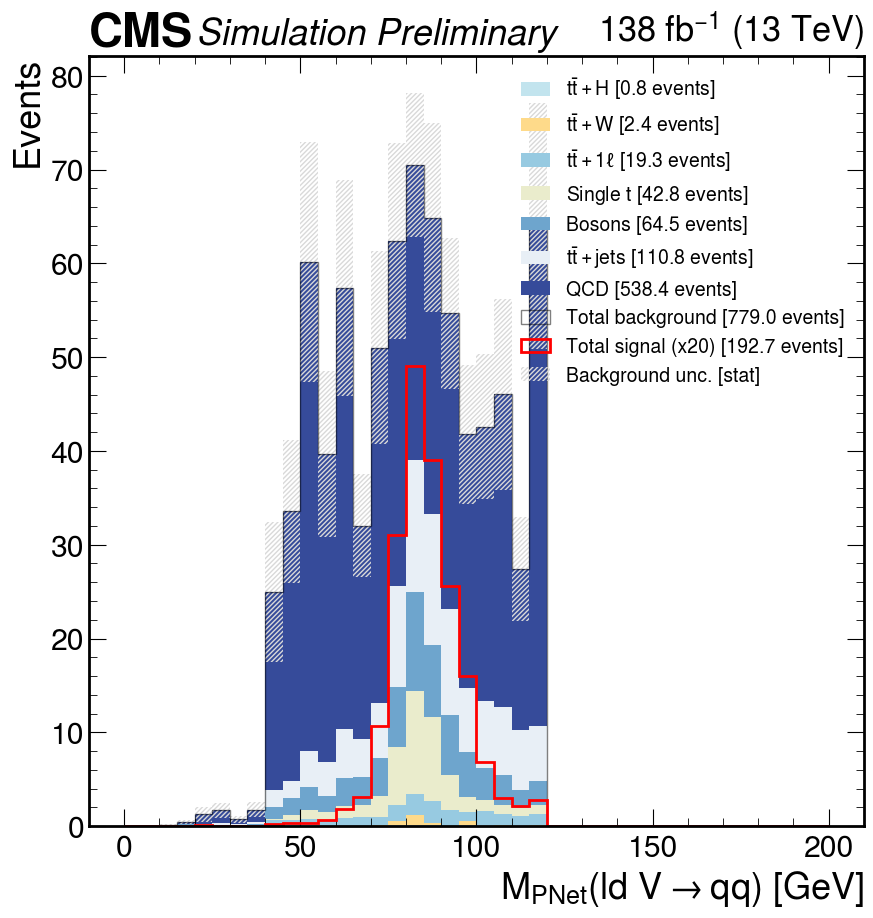

...

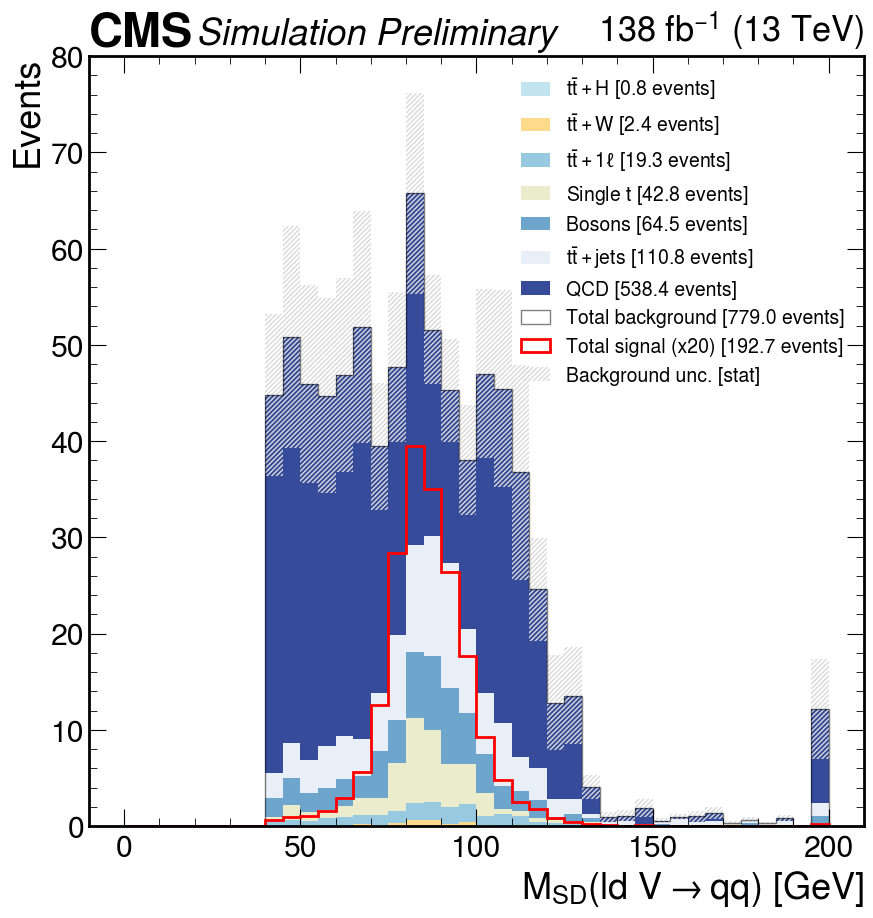

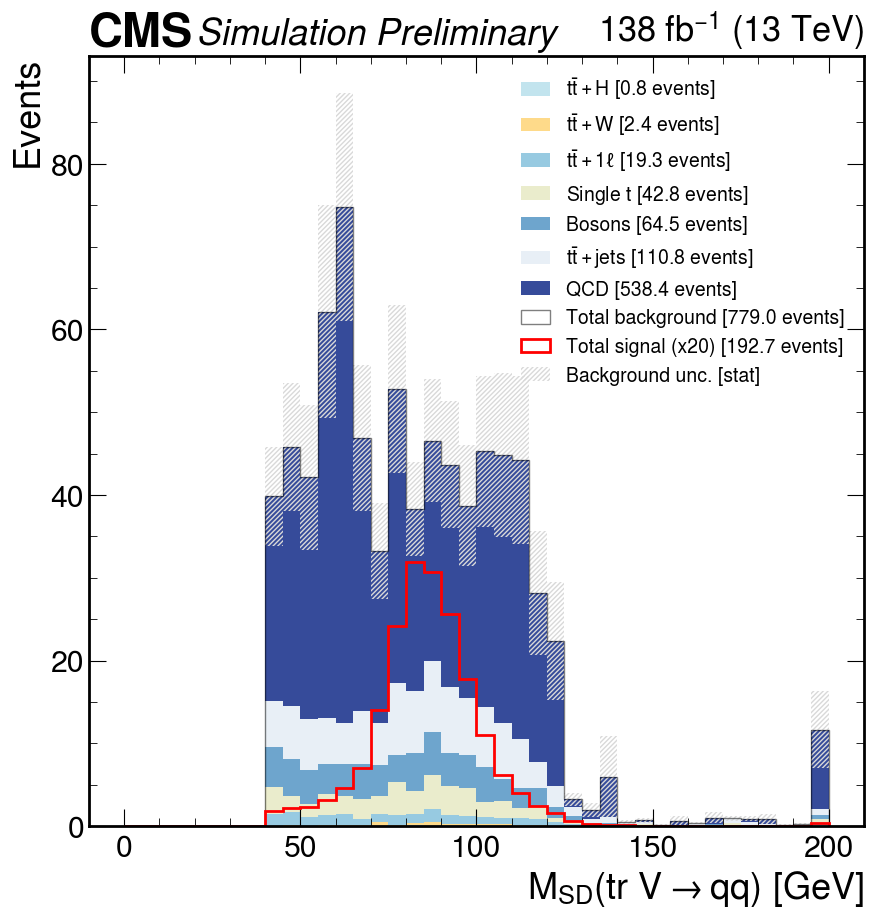

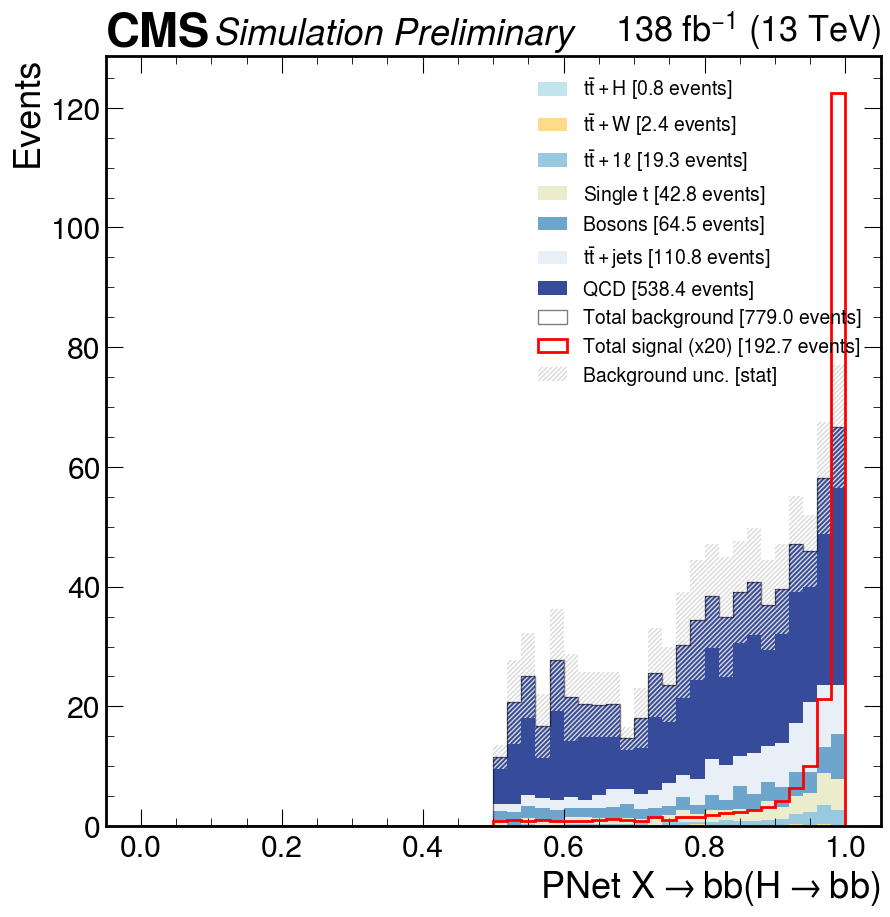

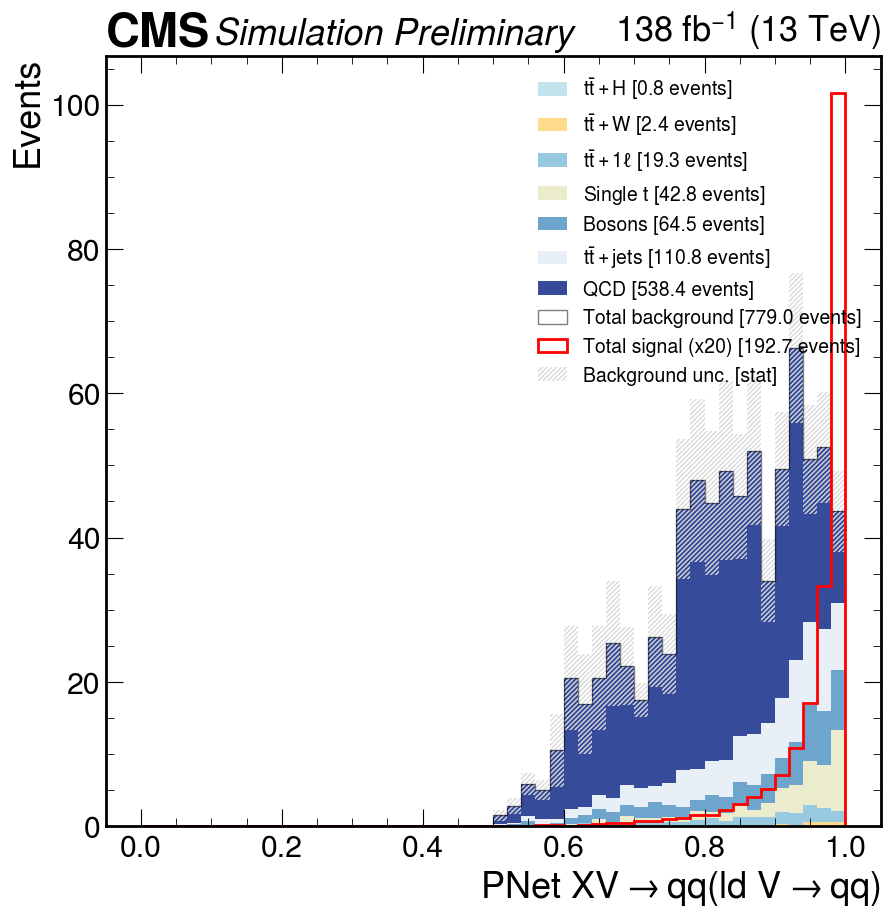

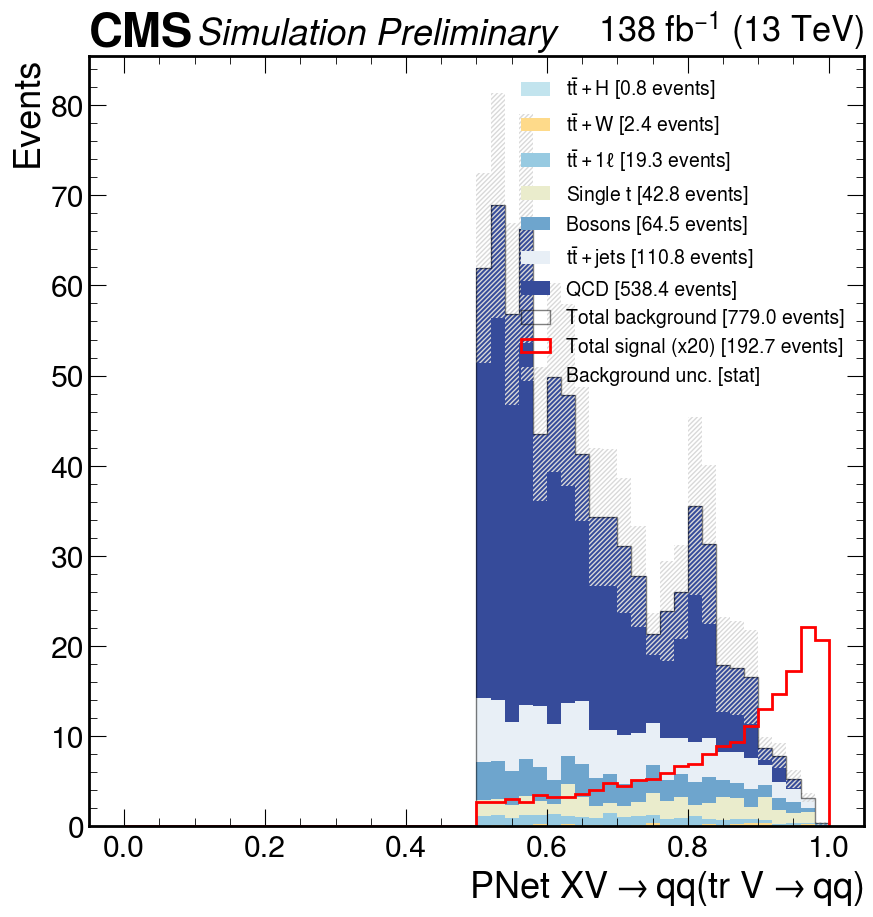

In [5]:
sel = "bdt_presel"

# Other
axes = vbsvvh.plot_sig_vs_bkg(
    "ST", np.linspace(1000, 5000, 41), 
    selection=sel,
    x_label="$S_T$ [GeV]",
    stacked=True,
    sig_scale=20
);

# VBS variables
axes = vbsvvh.plot_sig_vs_bkg(
    "M_jj", np.linspace(0, 2000, 51), 
    selection=sel,
    x_label=r"$M_{jj}$ [GeV]",
    stacked=True,
    sig_scale=20
);
axes = vbsvvh.plot_sig_vs_bkg(
    "deta_jj", np.linspace(0, 10, 51), 
    selection=sel,
    transf=abs,
    x_label=r"$|\Delta\eta_{jj}|$ [GeV]",
    stacked=True,
    sig_scale=20
);

# Fat jet ParticleNet mass
axes = vbsvvh.plot_sig_vs_bkg(
    "hbbfatjet_mass", np.linspace(0, 300, 61), 
    selection=sel,
    x_label=r"$M_{PNet}(H\rightarrow bb)$ [GeV]",
    stacked=True,
    sig_scale=20
);
axes = vbsvvh.plot_sig_vs_bkg(
    "ld_vqqfatjet_mass", np.linspace(0, 200, 41), 
    selection=sel,
    x_label=r"$M_{PNet}($ld $V\rightarrow qq)$ [GeV]",
    stacked=True,
    sig_scale=20
);
axes = vbsvvh.plot_sig_vs_bkg(
    "tr_vqqfatjet_mass", np.linspace(0, 200, 41), 
    selection=sel,
    x_label=r"$M_{PNet}($tr $V\rightarrow qq)$ [GeV]",
    stacked=True,
    sig_scale=20
);

# Fat jet MSD
axes = vbsvvh.plot_sig_vs_bkg(
    "hbbfatjet_msoftdrop", np.linspace(0, 300, 61), 
    selection=sel,
    x_label=r"$M_{SD}(H\rightarrow bb)$ [GeV]",
    stacked=True,
    sig_scale=20
);
axes = vbsvvh.plot_sig_vs_bkg(
    "ld_vqqfatjet_msoftdrop", np.linspace(0, 200, 41), 
    selection=sel,
    x_label=r"$M_{SD}($ld $V\rightarrow qq)$ [GeV]",
    stacked=True,
    sig_scale=20
);
axes = vbsvvh.plot_sig_vs_bkg(
    "tr_vqqfatjet_msoftdrop", np.linspace(0, 200, 41), 
    selection=sel,
    x_label=r"$M_{SD}($tr $V\rightarrow qq)$ [GeV]",
    stacked=True,
    sig_scale=20
);

# Fat jet ParticleNet score
axes = vbsvvh.plot_sig_vs_bkg(
    "hbbfatjet_score", np.linspace(0, 1, 51), 
    selection=sel,
    x_label=r"PNet $X\rightarrow bb(H\rightarrow bb)$",
    stacked=True,
    sig_scale=20
);
axes = vbsvvh.plot_sig_vs_bkg(
    "ld_vqqfatjet_score", np.linspace(0, 1, 51), 
    selection=sel,
    x_label=r"PNet $XV\rightarrow qq($ld $V\rightarrow qq)$",
    stacked=True,
    sig_scale=20
);
axes = vbsvvh.plot_sig_vs_bkg(
    "tr_vqqfatjet_score", np.linspace(0, 1, 51), 
    selection=sel,
    x_label=r"PNet $XV\rightarrow qq($tr $V\rightarrow qq)$",
    stacked=True,
    sig_scale=20
);

Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/main/opt/ST_sig_vs_bkg_stacked_bdt_presel_and_not_in_narrow_hwindow.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/main/opt/M_jj_sig_vs_bkg_stacked_bdt_presel_and_not_in_narrow_hwindow.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/main/opt/deta_jj_sig_vs_bkg_stacked_bdt_presel_and_not_in_narrow_hwindow.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/main/opt/hbbfatjet_mass_sig_vs_bkg_stacked_bdt_presel_and_not_in_narrow_hwindow.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/main/opt/ld_vqqfatjet_mass_sig_vs_bkg_stacked_bdt_presel_and_not_in_narrow_hwindow.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/main/opt/tr_vqqfatjet_mass_sig_vs_bkg_stacked_bdt_presel_and_not_in_narrow_hwindow.pdf
Wrote plot to /home/users/jguiang/public_html/vbsvvhjets_plots/main/opt/hbbfatjet_msoftdrop_sig_vs_bkg_stacked_bdt_presel_and_not_in_narrow_h

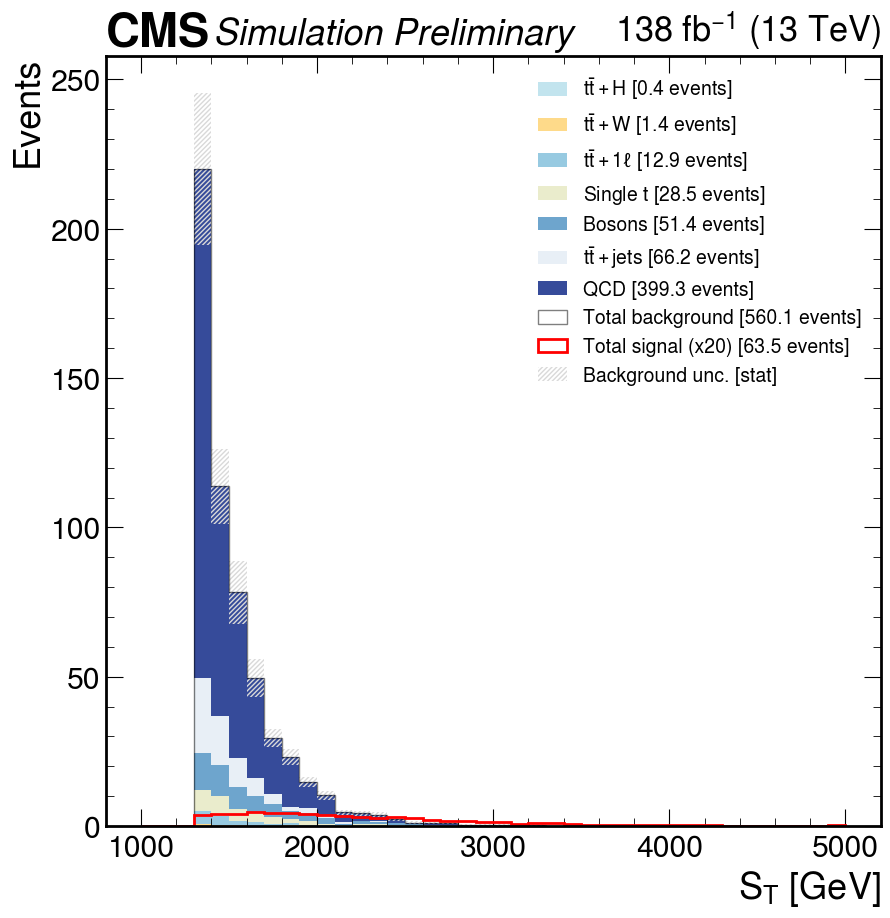

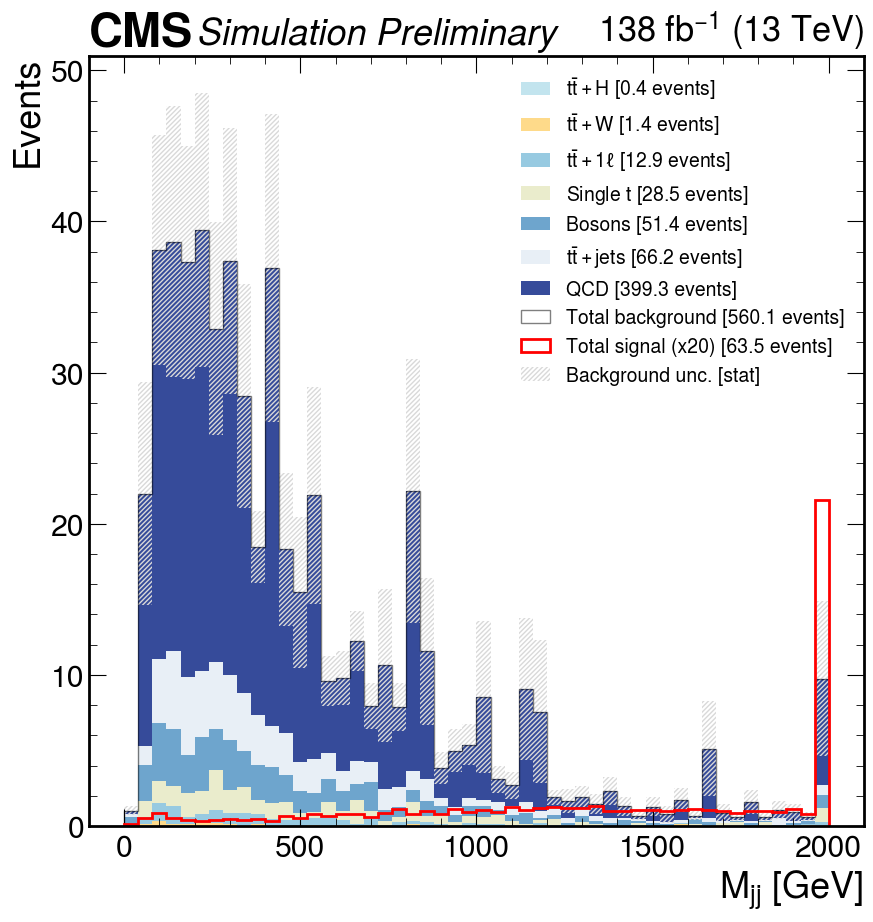

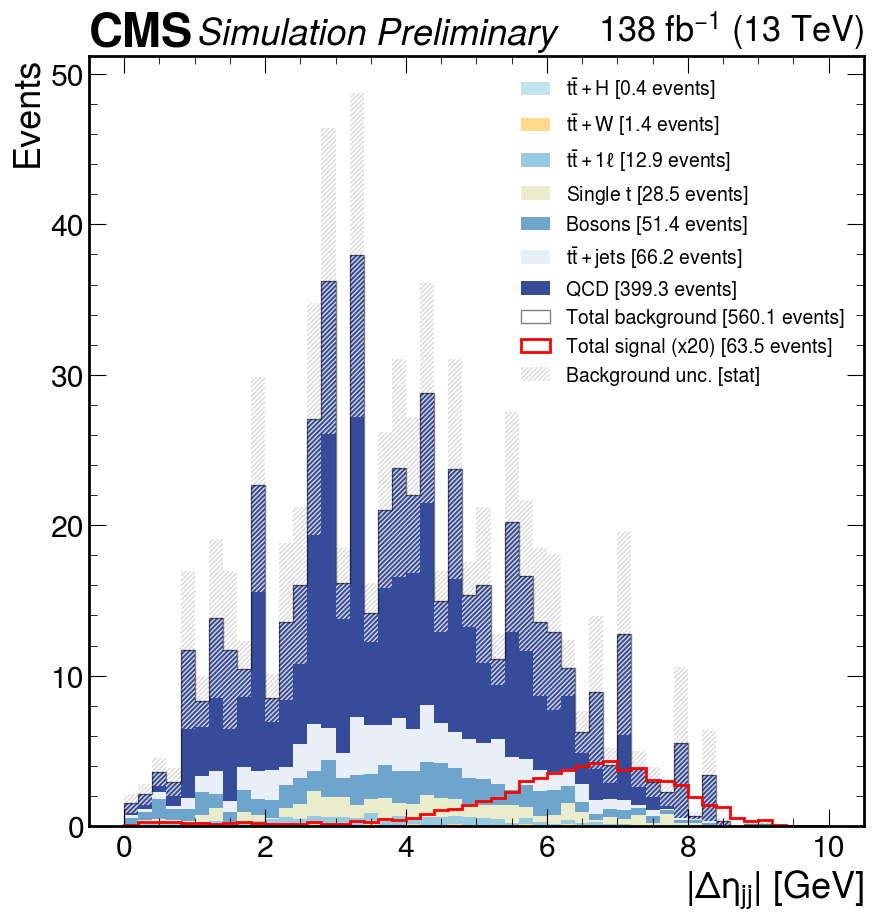

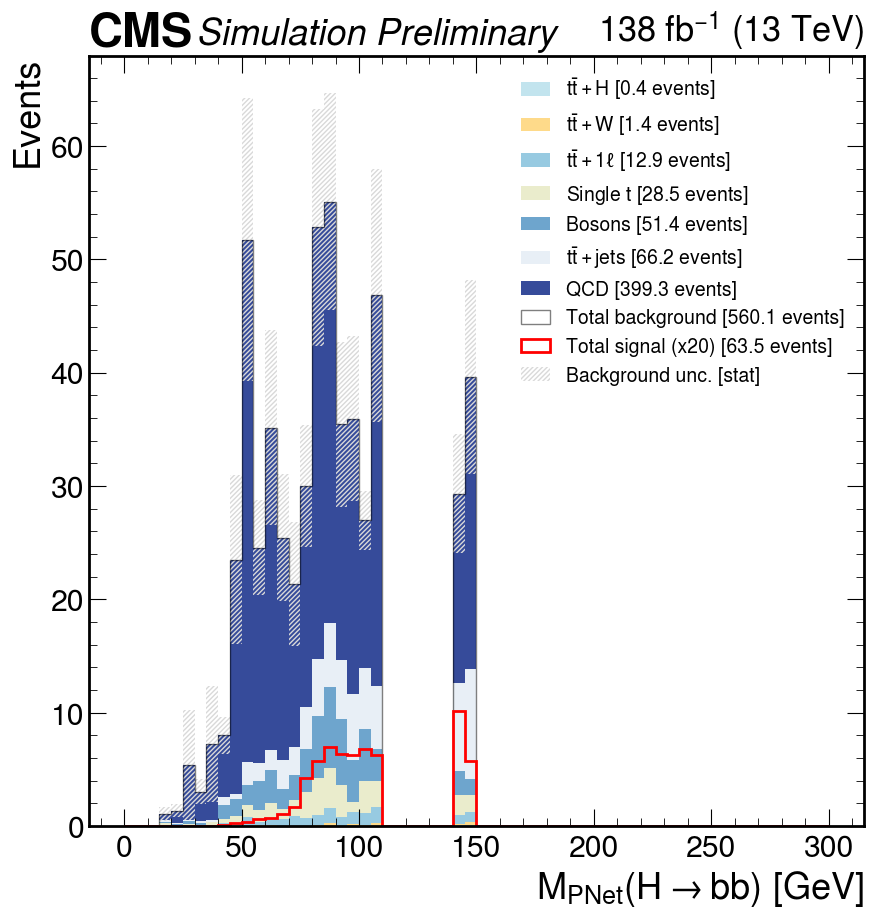

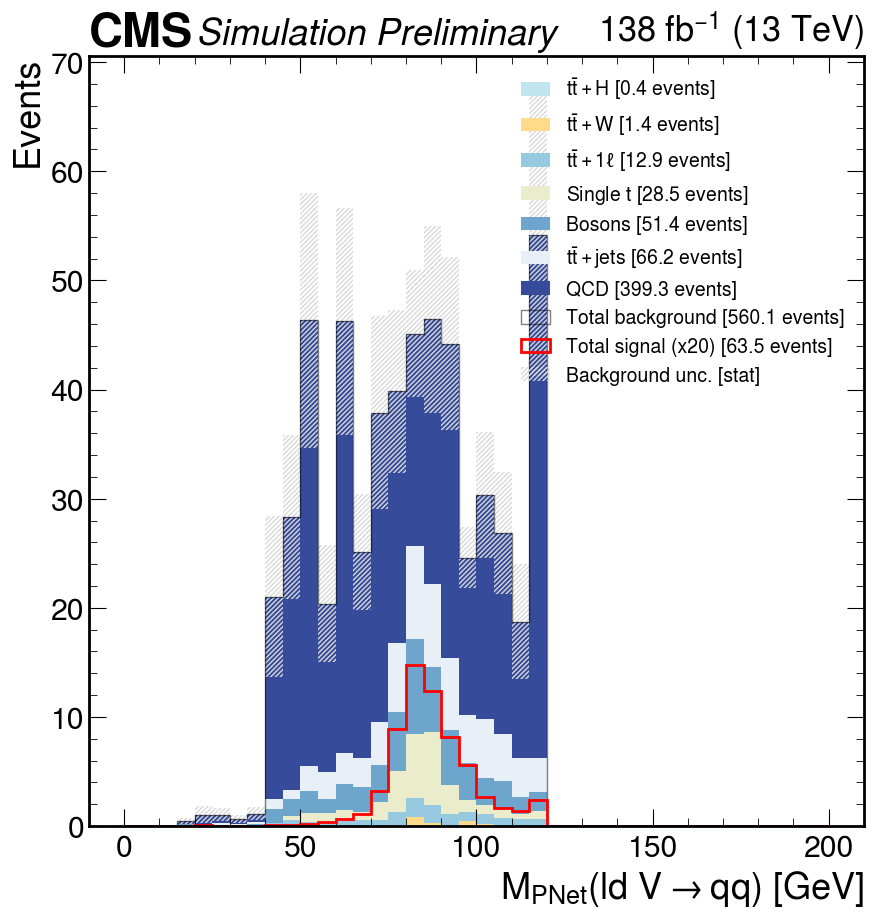

...

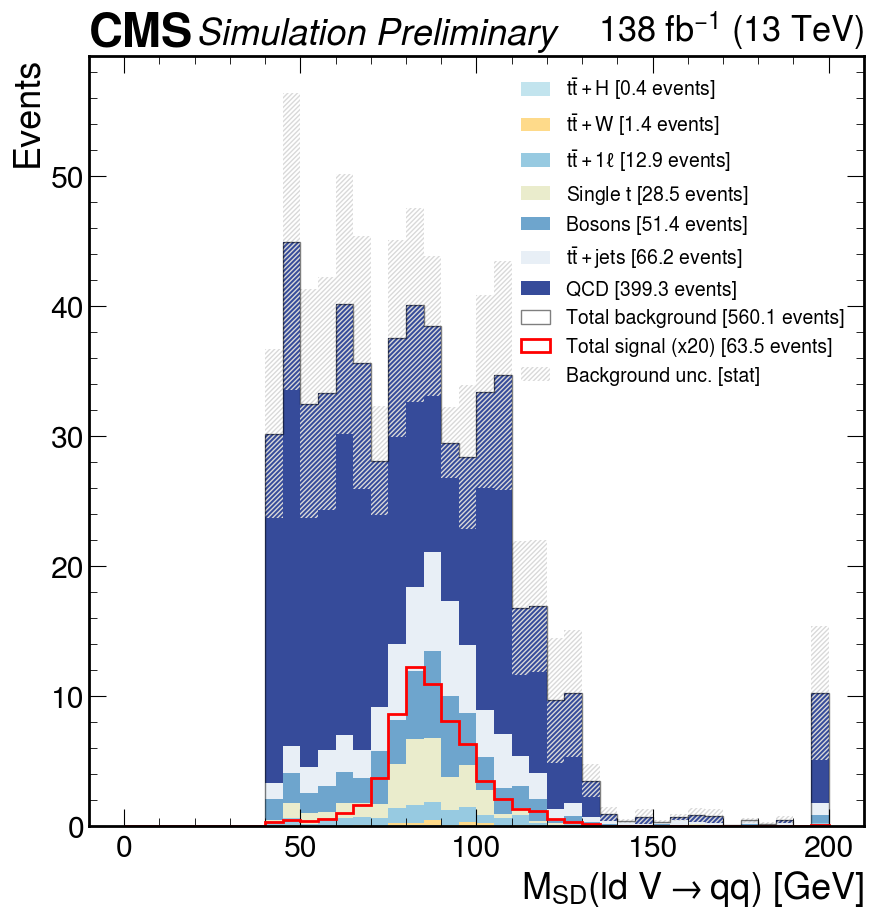

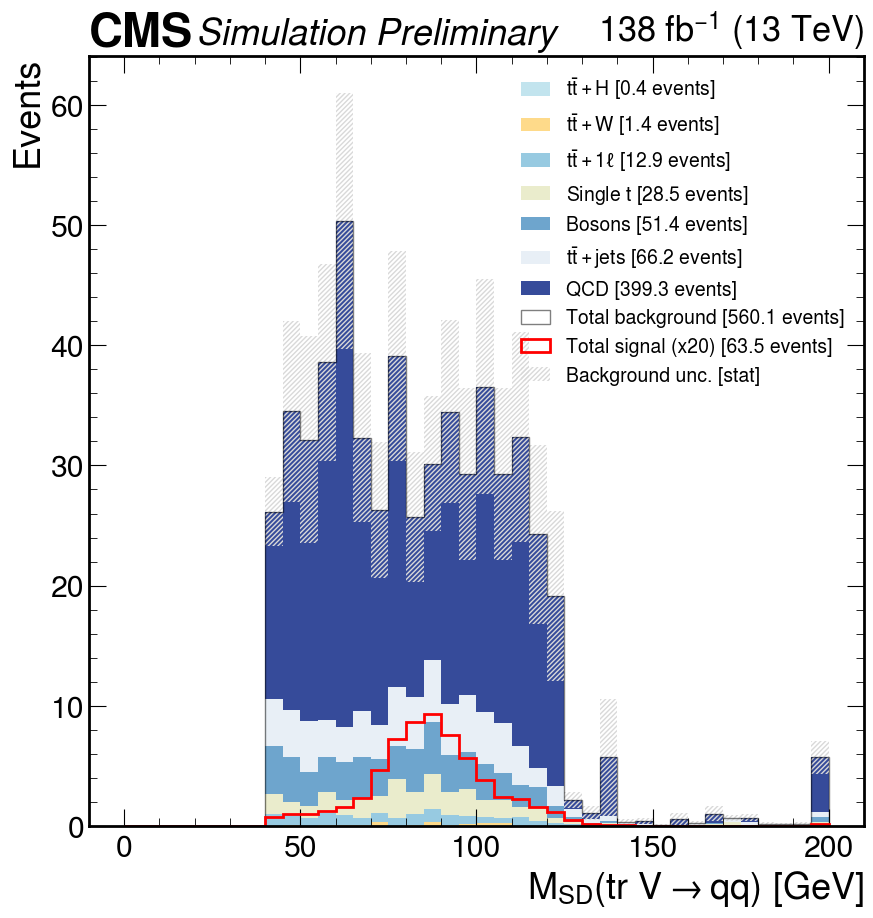

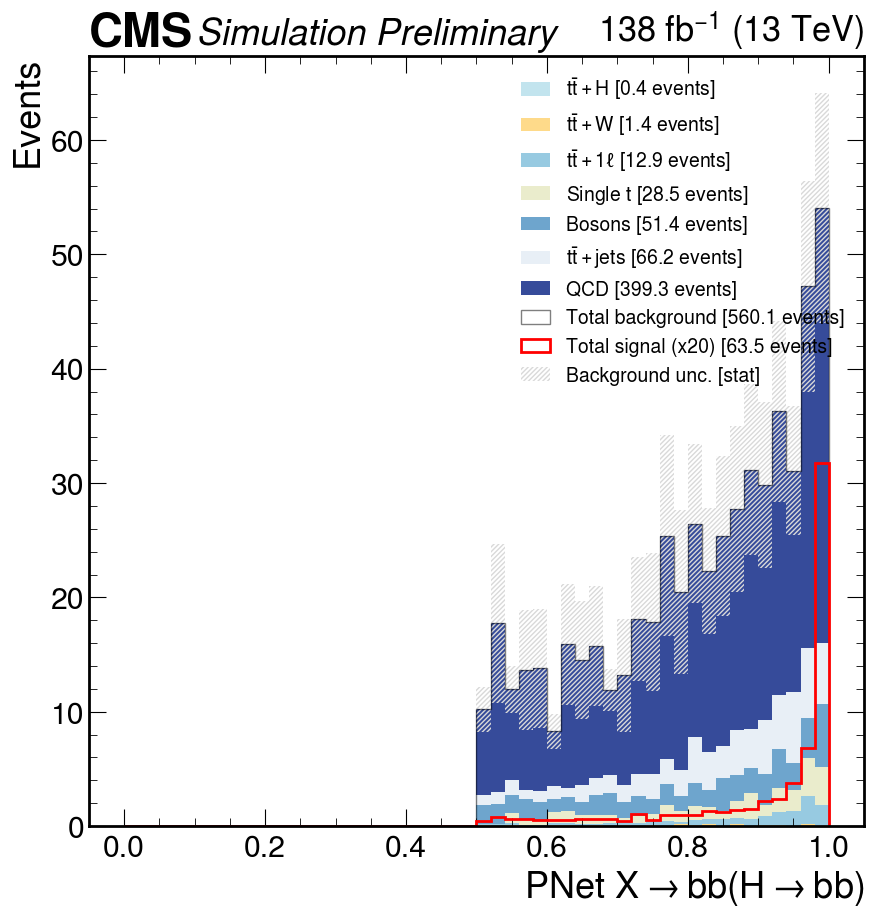

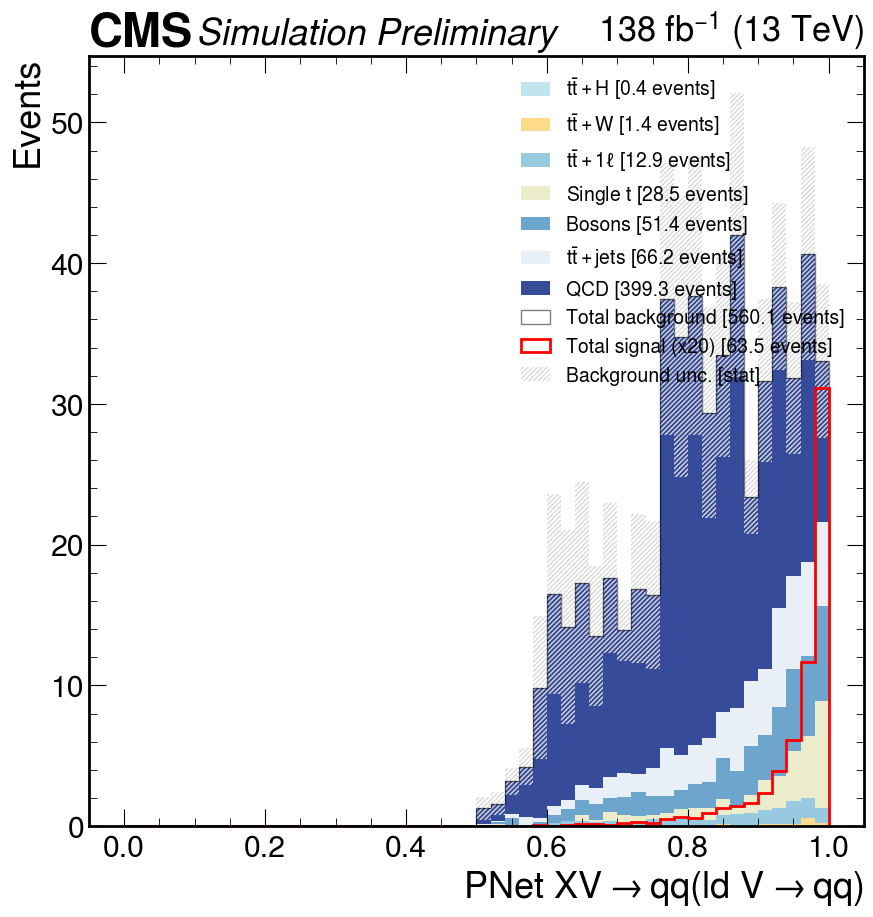

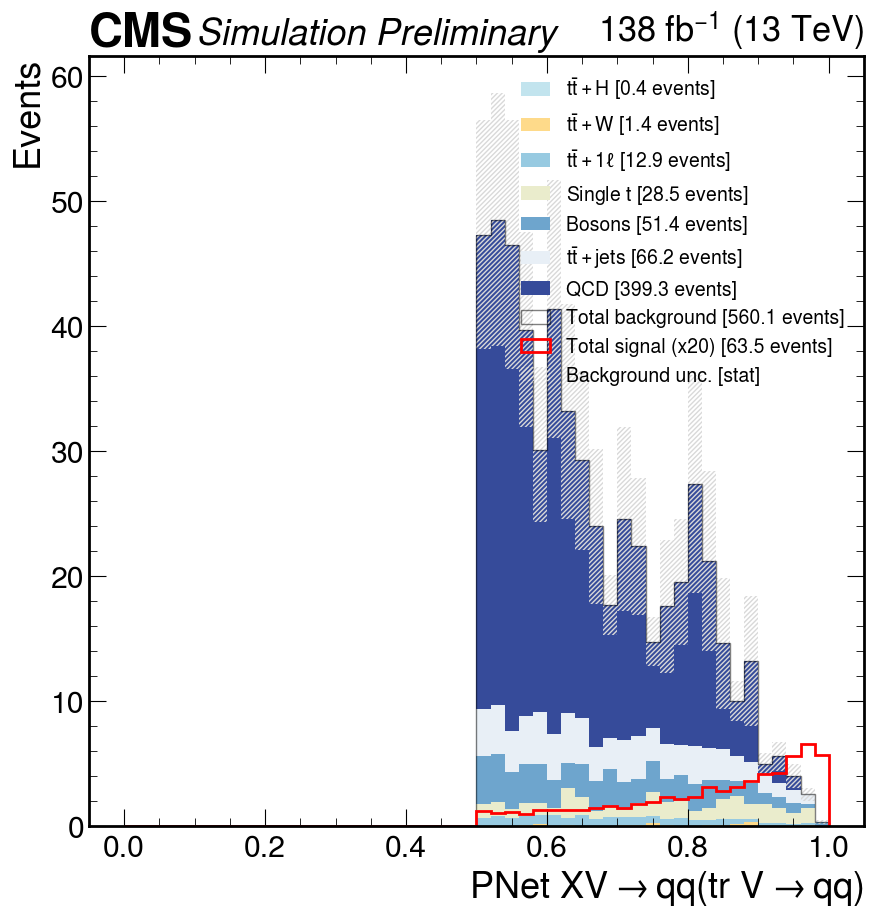

In [6]:
sel = "bdt_presel and not in_narrow_hwindow"

# Other
axes = vbsvvh.plot_sig_vs_bkg(
    "ST", np.linspace(1000, 5000, 41), 
    selection=sel,
    x_label="$S_T$ [GeV]",
    stacked=True,
    sig_scale=20
);

# VBS variables
axes = vbsvvh.plot_sig_vs_bkg(
    "M_jj", np.linspace(0, 2000, 51), 
    selection=sel,
    x_label=r"$M_{jj}$ [GeV]",
    stacked=True,
    sig_scale=20
);
axes = vbsvvh.plot_sig_vs_bkg(
    "deta_jj", np.linspace(0, 10, 51), 
    selection=sel,
    transf=abs,
    x_label=r"$|\Delta\eta_{jj}|$ [GeV]",
    stacked=True,
    sig_scale=20
);

# Fat jet ParticleNet mass
axes = vbsvvh.plot_sig_vs_bkg(
    "hbbfatjet_mass", np.linspace(0, 300, 61), 
    selection=sel,
    x_label=r"$M_{PNet}(H\rightarrow bb)$ [GeV]",
    stacked=True,
    sig_scale=20
);
axes = vbsvvh.plot_sig_vs_bkg(
    "ld_vqqfatjet_mass", np.linspace(0, 200, 41), 
    selection=sel,
    x_label=r"$M_{PNet}($ld $V\rightarrow qq)$ [GeV]",
    stacked=True,
    sig_scale=20
);
axes = vbsvvh.plot_sig_vs_bkg(
    "tr_vqqfatjet_mass", np.linspace(0, 200, 41), 
    selection=sel,
    x_label=r"$M_{PNet}($tr $V\rightarrow qq)$ [GeV]",
    stacked=True,
    sig_scale=20
);

# Fat jet MSD
axes = vbsvvh.plot_sig_vs_bkg(
    "hbbfatjet_msoftdrop", np.linspace(0, 300, 61), 
    selection=sel,
    x_label=r"$M_{SD}(H\rightarrow bb)$ [GeV]",
    stacked=True,
    sig_scale=20
);
axes = vbsvvh.plot_sig_vs_bkg(
    "ld_vqqfatjet_msoftdrop", np.linspace(0, 200, 41), 
    selection=sel,
    x_label=r"$M_{SD}($ld $V\rightarrow qq)$ [GeV]",
    stacked=True,
    sig_scale=20
);
axes = vbsvvh.plot_sig_vs_bkg(
    "tr_vqqfatjet_msoftdrop", np.linspace(0, 200, 41), 
    selection=sel,
    x_label=r"$M_{SD}($tr $V\rightarrow qq)$ [GeV]",
    stacked=True,
    sig_scale=20
);

# Fat jet ParticleNet score
axes = vbsvvh.plot_sig_vs_bkg(
    "hbbfatjet_score", np.linspace(0, 1, 51), 
    selection=sel,
    x_label=r"PNet $X\rightarrow bb(H\rightarrow bb)$",
    stacked=True,
    sig_scale=20
);
axes = vbsvvh.plot_sig_vs_bkg(
    "ld_vqqfatjet_score", np.linspace(0, 1, 51), 
    selection=sel,
    x_label=r"PNet $XV\rightarrow qq($ld $V\rightarrow qq)$",
    stacked=True,
    sig_scale=20
);
axes = vbsvvh.plot_sig_vs_bkg(
    "tr_vqqfatjet_score", np.linspace(0, 1, 51), 
    selection=sel,
    x_label=r"PNet $XV\rightarrow qq($tr $V\rightarrow qq)$",
    stacked=True,
    sig_scale=20
);